## CLIENT PROJECT :- PM-PR-0017

## PROJECT TEAM ID :- PTID-CDS-APR-24-1889

# 1 Business Case:
>- No-Churn Telecom has been providing phone services in Europe for more than ten years. But now, with new companies in the market, it's getting tough to keep our customers. Even though we've been lowering prices and offering great deals, more than 10% of our customers are switching to other companies.
>- No-Churn wants to explore possibility of Machine Learning to help with following use cases to retain competitive edge in the industry.

## PROJECT GOAL:
Help No-Churn with their use cases with ML
>- 1. Understanding the variables that are influencing the customers to migrate.

>- 2. Creating Churn risk scores that can be indicative to drive retention campaigns.

>- 3. Introduce new predicting variable “CHURN-FLAG” with values YES(1) or NO(0) so that email campaigns with lucrative offers
      can be targeted to Churn YES customers.

In [1]:
# DataBase Details:
# SQL database
# DB Name: project_telecom
# Table Name: telecom_churn_data


In [2]:
pip install mysql-connector-python 

     ---------------------------------------- 14.3/14.3 MB 4.3 MB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.


In [3]:
import os
# Establishing a connection to the MySQL database.
import mysql.connector

# Database connection parameters.
connection=mysql.connector.connect(host='18.136.157.135',# MYSQL server IP address.
                                  user='dm_team3',# Database username.
                                  password='DM!$!Team!27@9!20&',# Database password.
                                  database='project_telecom')# Database name.

# 2.Import Libraries:


In [4]:
# Importing NumPy for numerical opeartions.
import numpy as np

# Importing Seaborn for data visualization.
import seaborn as sns

# Importing Pandas for data manipulation.
import pandas as pd

# Importing Matplotlib for plotting.
import matplotlib.pyplot as plt

# Ensuring that plots appear in the notebook.
%matplotlib inline

# Ignoring warnings for cleaner output.
import warnings

# Disabling warnings to keep the output.
warnings.filterwarnings('ignore')

In [5]:
# Executing a SQL query to get the list of tables in the database.
pd.read_sql("show tables",connection)

,Tables_in_project_telecom
0,telecom_churn_data


# 3. Load Dataset:

In [6]:
# Read data from the 'telecom_churn_data' table in the database.
data = pd.read_sql("select * from telecom_churn_data",connection)

# Displaying the loaded data.
data

,columns1,columns2,columns3,columns4,columns5,columns6,columns7,columns8,columns9,columns10,...,columns12,columns13,columns14,columns15,columns16,columns17,columns18,columns19,columns20,columns21
0,KS,128,415,382-4657,no,yes,25,265.1,110,45.07,...,99,16.78,244.7,91,11.01,10,3,2.7,1,False.
1,OH,107,415,371-7191,no,yes,26,161.6,123,27.47,...,103,16.62,254.4,103,11.45,13.7,3,3.7,1,False.
2,NJ,137,415,358-1921,no,no,0,243.4,114,41.38,...,110,10.3,162.6,104,7.32,12.2,5,3.29,0,False.
3,OH,84,408,375-9999,yes,no,0,299.4,71,50.9,...,88,5.26,196.9,89,8.86,6.6,7,1.78,2,False.
4,OK,75,415,330-6626,yes,no,0,166.7,113,28.34,...,122,12.61,186.9,121,8.41,10.1,3,2.73,3,False.
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4612,NY,57,510,345-7512,no,yes,25,144,81,24.48,...,112,15.91,158.6,122,7.14,8.5,6,2.3,3,False.
4613,NM,177,408,343-6820,no,yes,29,189,91,32.13,...,96,25.76,163.6,116,7.36,15.7,1,4.24,3,False.
4614,VT,67,408,338-4794,no,yes,33,127.5,126,21.68,...,129,25.17,200.9,91,9.04,13,3,3.51,1,False.
4615,MI,98,415,355-8388,no,yes,23,168.9,98,28.71,...,117,19.24,165.5,96,7.45,14.3,3,3.86,0,False.


In [7]:
# Displaying all the columns.
data.columns

Index(['columns1', 'columns2', 'columns3', 'columns4', 'columns5', 'columns6',
       'columns7', 'columns8', 'columns9', 'columns10', 'columns11',
       'columns12', 'columns13', 'columns14', 'columns15', 'columns16',
       'columns17', 'columns18', 'columns19', 'columns20', 'columns21'],
      dtype='object')

### Insights:
>- The dataset contains 4316 rows and 21 columns, including the final target variable.

>- Column names were corrected as they were not properly named.

In [8]:
# Renaming columns in the 'data' DataFrame :

df_rename = {'columns1':'State',           
'columns2':'Account Length',  
'columns3':'Area Code',    
'columns4':'Phone',           
'columns5':'International Plan',  
'columns6':'VMail Plan',          
'columns7':'VMail Message', 
'columns8':'Day Mins', 
'columns9':'Day Calls', 
'columns10':'Day Charge', 
'columns11':'Eve Mins', 
'columns12':'Eve Calls', 
'columns13':'Eve Charge', 
'columns14':'Night Mins',
'columns15':'Night Calls', 
'columns16':'Night Charge', 
'columns17':'International Mins', 
'columns18':'International calls', 
'columns19':'International Charge', 
'columns20':'CustServ Calls', 
'columns21':'Churn'}


# Renaming columns in the 'data' DataFrame using "rename":
data = data.rename(columns=df_rename)


# Setting the options to display all Rows and columns in the output.
pd.set_option('display.max_columns',None)
pd.set_option('display.max_rows',None)
data

,State,Account Length,Area Code,Phone,International Plan,VMail Plan,VMail Message,Day Mins,Day Calls,Day Charge,Eve Mins,Eve Calls,Eve Charge,Night Mins,Night Calls,Night Charge,International Mins,International calls,International Charge,CustServ Calls,Churn
0,KS,128,415,382-4657,no,yes,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10,3,2.7,1,False.
1,OH,107,415,371-7191,no,yes,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.7,1,False.
2,NJ,137,415,358-1921,no,no,0,243.4,114,41.38,121.2,110,10.3,162.6,104,7.32,12.2,5,3.29,0,False.
3,OH,84,408,375-9999,yes,no,0,299.4,71,50.9,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,False.
4,OK,75,415,330-6626,yes,no,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,False.
5,AL,118,510,391-8027,yes,no,0,223.4,98,37.98,220.6,101,18.75,203.9,118,9.18,6.3,6,1.7,0,False.
6,MA,121,510,355-9993,no,yes,24,218.2,88,37.09,348.5,108,29.62,212.6,118,9.57,7.5,7,2.03,3,False.
7,MO,147,415,329-9001,yes,no,0,157,79,26.69,103.1,94,8.76,211.8,96,9.53,7.1,6,1.92,0,False.
8,LA,117,408,335-4719,no,no,0,184.5,97,31.37,351.6,80,29.89,215.8,90,9.71,8.7,4,2.35,1,False.
9,WV,141,415,330-8173,yes,yes,37,258.6,84,43.96,222,111,18.87,326.4,97,14.69,11.2,5,3.02,0,False.


# 4. Basic Checks:

In [9]:
# shape:
data.shape

(4617, 21)

In [10]:
# Dtypes:
data.dtypes

State                   object
Account Length          object
Area Code               object
Phone                   object
International Plan      object
VMail Plan              object
VMail Message           object
Day Mins                object
Day Calls               object
Day Charge              object
Eve Mins                object
Eve Calls               object
Eve Charge              object
Night Mins              object
Night Calls             object
Night Charge            object
International Mins      object
International calls     object
International Charge    object
CustServ Calls          object
Churn                   object
dtype: object

In [11]:
# Head:
data.head()

,State,Account Length,Area Code,Phone,International Plan,VMail Plan,VMail Message,Day Mins,Day Calls,Day Charge,Eve Mins,Eve Calls,Eve Charge,Night Mins,Night Calls,Night Charge,International Mins,International calls,International Charge,CustServ Calls,Churn
0,KS,128,415,382-4657,no,yes,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10,3,2.7,1,False.
1,OH,107,415,371-7191,no,yes,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.7,1,False.
2,NJ,137,415,358-1921,no,no,0,243.4,114,41.38,121.2,110,10.3,162.6,104,7.32,12.2,5,3.29,0,False.
3,OH,84,408,375-9999,yes,no,0,299.4,71,50.9,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,False.
4,OK,75,415,330-6626,yes,no,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,False.


In [12]:
# Tail:
data.tail()

,State,Account Length,Area Code,Phone,International Plan,VMail Plan,VMail Message,Day Mins,Day Calls,Day Charge,Eve Mins,Eve Calls,Eve Charge,Night Mins,Night Calls,Night Charge,International Mins,International calls,International Charge,CustServ Calls,Churn
4612,NY,57,510,345-7512,no,yes,25,144,81,24.48,187.2,112,15.91,158.6,122,7.14,8.5,6,2.3,3,False.
4613,NM,177,408,343-6820,no,yes,29,189,91,32.13,303.1,96,25.76,163.6,116,7.36,15.7,1,4.24,3,False.
4614,VT,67,408,338-4794,no,yes,33,127.5,126,21.68,296.1,129,25.17,200.9,91,9.04,13,3,3.51,1,False.
4615,MI,98,415,355-8388,no,yes,23,168.9,98,28.71,226.3,117,19.24,165.5,96,7.45,14.3,3,3.86,0,False.
4616,IN,140,415,409-6884,no,no,0,204.7,100,34.8,126.8,107,10.78,202.8,115,9.13,12.1,4,3.27,2,False.


In [13]:
# Iterating over each numerical column in 'num_col'.
for i in data:
    
    ## find unique categories in data:
    print(i,data[i].unique())
    
    ## find value counts for each unique categories in data:
    print(i,data[i].value_counts())
    
    ## It will print a seperator for clarity.
    print("*************************************************")

State ['KS' 'OH' 'NJ' 'OK' 'AL' 'MA' 'MO' 'LA' 'WV' 'IN' 'RI' 'IA' 'MT' 'NY'
 'ID' 'VT' 'VA' 'TX' 'FL' 'CO' 'AZ' 'SC' 'NE' 'WY' 'HI' 'IL' 'NH' 'GA'
 'AK' 'MD' 'AR' 'WI' 'OR' 'MI' 'DE' 'UT' 'CA' 'MN' 'SD' 'NC' 'WA' 'NM'
 'NV' 'DC' 'KY' 'ME' 'MS' 'TN' 'PA' 'CT' 'ND']
State WV    149
AL    114
MN    112
OH    110
ID    110
VA    109
NY    109
OR    107
NJ    106
WY    106
TX    105
UT    104
WI     99
MI     98
MA     97
KS     96
VT     95
ME     95
CT     92
MD     92
MT     92
MS     91
NH     91
CO     91
KY     90
RI     90
NV     89
IN     89
DE     89
WA     89
FL     85
NM     84
MO     84
SC     83
NC     83
TN     83
DC     82
AZ     81
ND     80
OK     80
HI     79
NE     79
IL     79
AR     77
GA     77
SD     76
LA     73
AK     69
PA     68
IA     65
CA     44
Name: State, dtype: int64
*************************************************
Account Length ['128' '107' '137' '84' '75' '118' '121' '147' '117' '141' '65' '74' '168'
 '95' '62' '161' '85' '93' '76' '73' '77' '130' '111

In [14]:
# Converting selected columns to integer type in 'data' DataFrame.
data[['Account Length','Area Code','VMail Message','Day Calls','Eve Calls',
      'Night Calls','International calls','CustServ Calls']] = data[['Account Length',
      'Area Code','VMail Message','Day Calls', 'Eve Calls','Night Calls',
      'International calls','CustServ Calls']].astype(np.int64)

In [15]:
# Converting selected columns to float type in 'data' DataFrame.
data[['Day Mins','Day Charge','Night Mins','Night Charge','International Mins',
      'International Charge',"Eve Mins","Eve Charge"]]=data[['Day Mins',
      'Day Charge','Night Mins','Night Charge','International Mins',
      'International Charge',"Eve Mins","Eve Charge"]].astype(np.float64)

In [16]:
# fetch the numerical columns:
num_col = data.select_dtypes(include=["int64","float64"])
num_col.columns

Index(['Account Length', 'Area Code', 'VMail Message', 'Day Mins', 'Day Calls',
       'Day Charge', 'Eve Mins', 'Eve Calls', 'Eve Charge', 'Night Mins',
       'Night Calls', 'Night Charge', 'International Mins',
       'International calls', 'International Charge', 'CustServ Calls'],
      dtype='object')

In [17]:
# fetch the categorical columns:
cat_col = data.select_dtypes(include=["object"])
cat_col.columns

Index(['State', 'Phone', 'International Plan', 'VMail Plan', 'Churn'], dtype='object')

In [18]:
# Describe:
# Here, 'T' is used to transpose the DataFrame.
data.describe().T

,count,mean,std,min,25%,50%,75%,max
Account Length,4617.0,100.645224,39.597194,1.00,74.00,100.00,127.00,243.00
Area Code,4617.0,437.046350,42.288212,408.00,408.00,415.00,510.00,510.00
VMail Message,4617.0,7.849903,13.592333,0.00,0.00,0.00,17.00,51.00
Day Mins,4617.0,180.447152,53.983540,0.00,143.70,180.00,216.80,351.50
Day Calls,4617.0,100.054364,19.883027,0.00,87.00,100.00,113.00,165.00
Day Charge,4617.0,30.676576,9.177145,0.00,24.43,30.60,36.86,59.76
Eve Mins,4617.0,200.429088,50.557001,0.00,165.90,200.80,234.00,363.70
Eve Calls,4617.0,100.179770,19.821314,0.00,87.00,101.00,114.00,170.00
Eve Charge,4617.0,17.036703,4.297332,0.00,14.10,17.07,19.89,30.91
Night Mins,4617.0,200.623933,50.543616,23.20,167.10,200.80,234.90,395.00


In [19]:
# Describe:
# here "O" represents the "Object" columns:
data.describe(include="O")

,State,Phone,International Plan,VMail Plan,Churn
count,4617,4617,4617,4617,4617
unique,51,4617,2,2,2
top,WV,382-4657,no,no,False.
freq,149,1,4171,3381,3961


In [20]:
# Fetching the information of data:
# Displays details like column names, data types, and non-null counts for each column
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4617 entries, 0 to 4616
Data columns (total 21 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   State                 4617 non-null   object 
 1   Account Length        4617 non-null   int64  
 2   Area Code             4617 non-null   int64  
 3   Phone                 4617 non-null   object 
 4   International Plan    4617 non-null   object 
 5   VMail Plan            4617 non-null   object 
 6   VMail Message         4617 non-null   int64  
 7   Day Mins              4617 non-null   float64
 8   Day Calls             4617 non-null   int64  
 9   Day Charge            4617 non-null   float64
 10  Eve Mins              4617 non-null   float64
 11  Eve Calls             4617 non-null   int64  
 12  Eve Charge            4617 non-null   float64
 13  Night Mins            4617 non-null   float64
 14  Night Calls           4617 non-null   int64  
 15  Night Charge         

# DOMAIN ANALYSIS :

**1. State:**
>- Where the customer lives in the USA.
    
**2. Account Length:** 
>- How many days the customer has been with our company.

**3. Area Code:** 
>- The customer's area code.

**4. Phone:**
>- A special number that identifies each customer.

**5. International Plan:** 
>- Shows if the customer has a plan for making international calls.

**6. Voicemail Plan:** 
>- Shows if the customer has a voicemail plan.

**7. Voicemail Messages:**
>-How many voicemail messages the customer has.

**8. Daytime Minutes:**
>-The total minutes the customer used for daytime calls.

**9. Daytime Calls:** 
>-How many calls the customer made during the day.

**10. Daytime Charge:** 
>-How much money the customer spent on daytime services.
    
**11. Evening Minutes:**
>-The total minutes the customer used for evening calls.

**12. Evening Calls:**
>-How many calls the customer made during the evening.

**13. Evening Charge:** 
>-How much money the customer spent on evening services.

**14. Nighttime Minutes:**
>-The total minutes the customer used for nighttime calls.

**15. Nighttime Calls:** 
>-How many calls the customer made during the night.

**16. Nighttime Charge:** 
>-How much money the customer spent on nighttime services.

**17. International Minutes:** 
>-The total minutes the customer used for international calls.

**18. International Calls:** 
>-How many international calls the customer made.

**19. International Charge:** 
>-How much money the customer spent on international calls.

**20. Customer Service Calls:**
>-How many times the customer called our customer service.

**21. Churn:** 
>-Tells us if the customer left us (TRUE) or stayed with us (FALSE).

# 5. EDA:
## 5.1. Univariate:

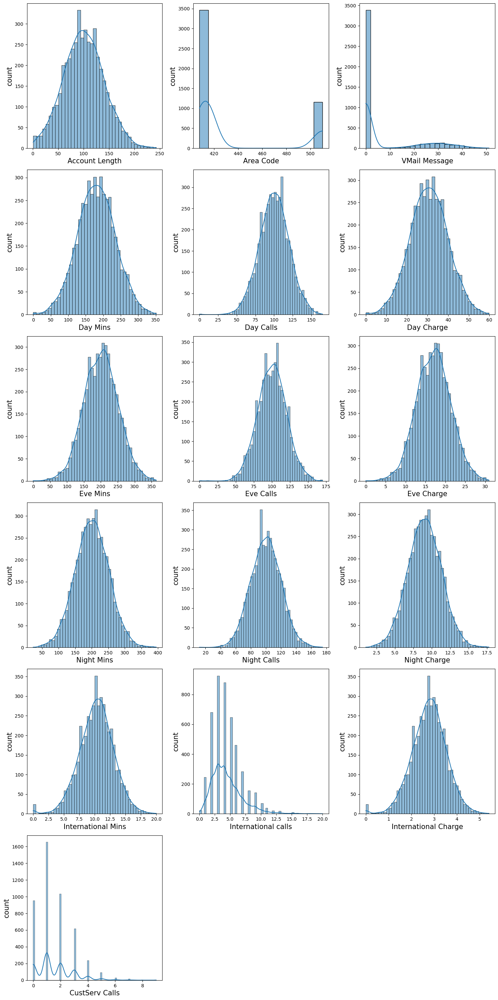

In [21]:
# It will create a new figure with a fixed size and background color.
plt.figure(figsize=(15,30), facecolor='white')

# Initializing a counter for subplot placement.
plotnumber = 1

# Looping through each num_col in data :
for column in num_col:
    
    # Limiting the number of subplots to 16.
    if plotnumber<=16 :
        
        # Creating a subplot in a 6*3 grid.
        ax = plt.subplot(6,3,plotnumber)
        
        # Plotting a histogram with kernel density function.
        sns.histplot(x=num_col[column],kde=True)
        
        # Adding the label to the x and y axes and setting font.
        plt.xlabel(column,fontsize=15)
        plt.ylabel('count',fontsize=15)
        
    # Incrementing the plot number for the next iteration.    
    plotnumber+=1
    
# Adjusting the layout of the subplots for better spacing.
plt.tight_layout()

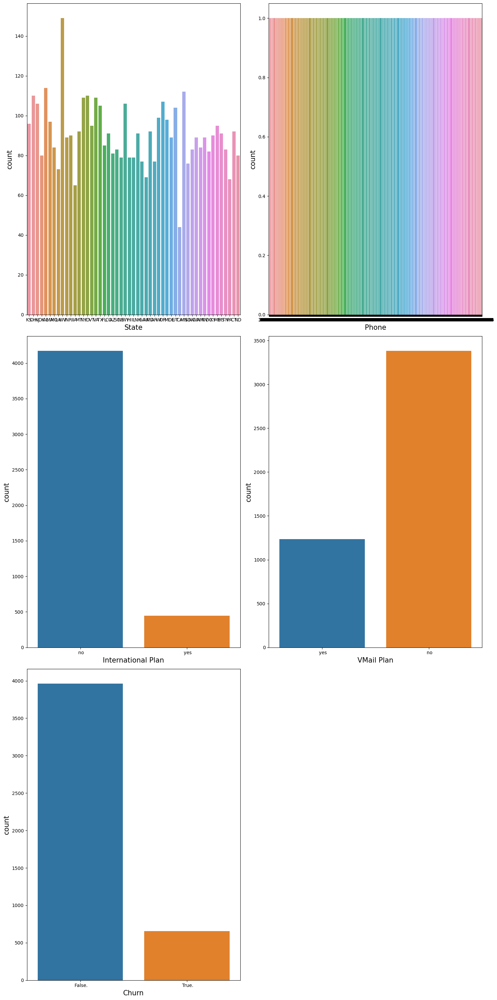

In [22]:
# It will create a new figure with a fixed size and background color.
plt.figure(figsize=(15,30), facecolor='white')

# Initializing a counter for subplot placement.
plotnumber = 1

# Looping through each cat_col in data :
for column in cat_col:
    
    # Limiting the number of subplots to 6.
    if plotnumber<=6:
        
        # Creating a subplot in a 3*2  grid.
        ax = plt.subplot(3,2,plotnumber)
        
        # Plotting a Countplot with kernel density function.
        sns.countplot(x=cat_col[column])
        
        # Adding the label to the x and y axes and setting font.
        plt.xlabel(column,fontsize=15)
        plt.ylabel('count',fontsize=15)
        
    # Incrementing the plot number for the next iteration.    
    plotnumber+=1
    
# Adjusting the layout of the subplots for better spacing.   
plt.tight_layout()

In [23]:
# We are installing the Sweetviz library using the pip package manager.
! pip install sweetviz

In [24]:
# It imports the Sweetviz library and assigns it the alias 'sv'.
import sweetviz as sv

# It uses Sweetviz to analyze the 'data' DataFrame and generates a report,
# which is stored in the variable 'my_report'.
my_report = sv.analyze(data)

# It saves the analysis repport in an HTML file named "my_report.html",
# and then save it.
my_report.show_html()

                                             |                                             | [  0%]   00:00 ->…

Report SWEETVIZ_REPORT.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


### Insights from Univariate Analysis :

**1. Customer Distribution by State:**
>- Only 3% of customers are from West Virginia (WV).
>- The majority of customers (60%) come from various other states.
>- Each of the remaining states represents about 2% of our customers.

**2. Area Code Distribution:**
>- Half of our customers (50%) have the area code 415.
>- The other half is evenly split between area codes 408 and 510, with each having 25% of customers.

**3. International Plan Subscription:**
>- Most customers (90%) haven't subscribed to the International plan.
>- Only a small portion (10%) have opted for the International plan.

**4. Voicemail Subscription:**
>- About 27% of customers have subscribed to voicemail.
>- The majority (73%) haven't subscribed to voicemail, and among them, no voicemail messages have been recorded.

**5. Usage Patterns:**
>- Less than 1% of customers use the highest number of daytime minutes (154 minutes).
>- The highest number of calls made in a day is 102.
>- The highest charge in a day is $26.18.
>- The highest evening minutes spent is 169.9 minutes.

**6. Evening Calls and Charges:**
>- Only 2% of customers (111) make evening calls, the highest among all.
>- The most common charge for evening calls is $14.25.

**7. Night Usage Patterns:**
>- The highest night minutes spent is 194.3 minutes.
>- The most night calls made by a customer is 105, with 115 customers reaching this number.
>- Less than 1% of customers have night charges.

**8. International Calls and Charges:**
>- The most common international minutes used is 9.8 minutes.
>- About 20% of customers (925) have made 3 international calls.
>- The highest international charge is $2.65.

**9. Survey Calls:**
>- 365 customers had at least 1 survey call.

**10. Churn Rate:**
>- The majority (86%) of customers are not likely to leave.
>- The remaining 14% are likely to churn or leave.

## 5.2. Bivariate:

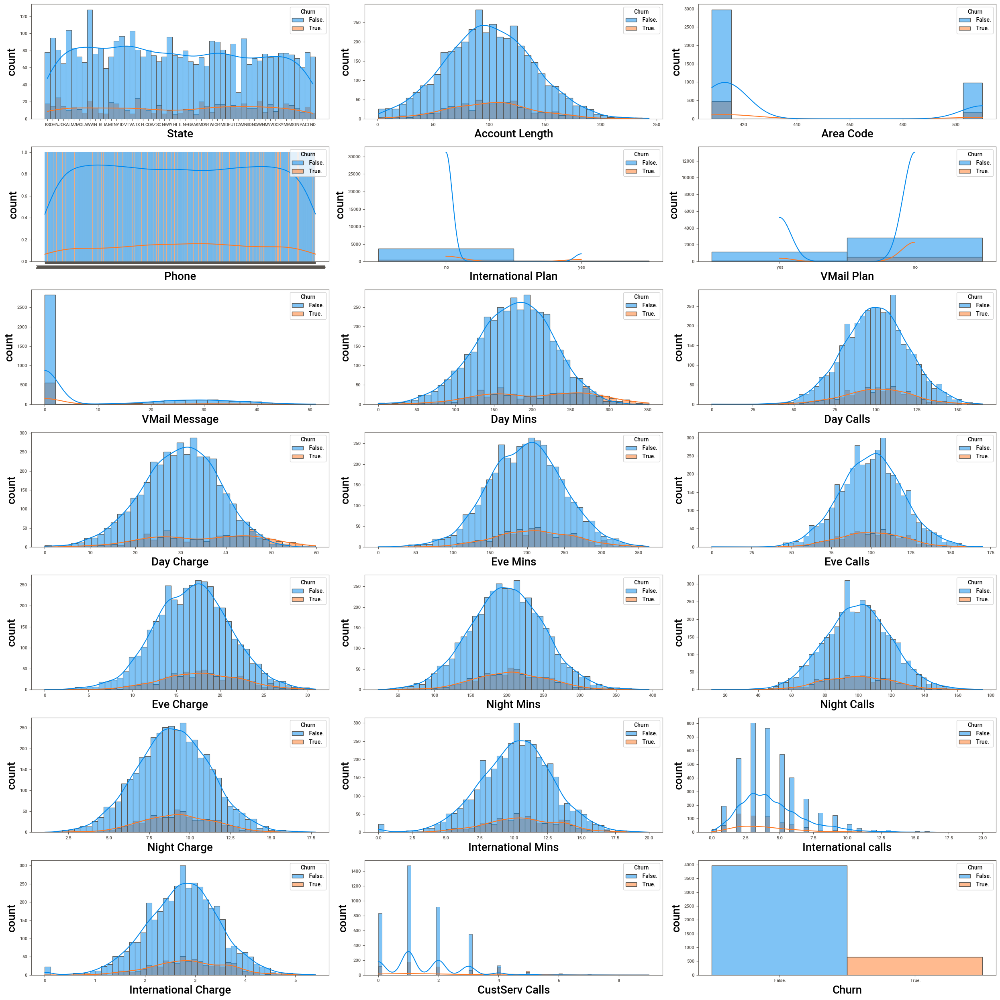

In [25]:
plt.figure(figsize=(25,25))
plotnumber = 1

for column in data:
    if plotnumber<=21:
        plt.subplot(7,3,plotnumber)
        sns.histplot(data=data, x =column, kde=True, hue="Churn", color='orange')
        plt.xlabel(column,fontsize=20)
        plt.ylabel("count",fontsize=20)
    plotnumber+=1
plt.tight_layout()

### insight:
>- Upon conducting bivariate analysis, wherein we compared various factors with the churn column representing whether customers choose to stay or leave, a noteworthy observation emerged. The analysis, visualized through bivariate plots, revealed a predominant trend: a substantial majority of customers exhibited a preference for not leaving. The data-driven insights gleaned from these visualizations shed light on the prevailing customer behavior, providing a foundational understanding of the factors influencing customer retention. This discovery serves as a crucial precursor to further exploratory analysis and guides our efforts in tailoring strategies to enhance customer retention based on these observed patterns.

In [26]:
num_col.columns

Index(['Account Length', 'Area Code', 'VMail Message', 'Day Mins', 'Day Calls',
       'Day Charge', 'Eve Mins', 'Eve Calls', 'Eve Charge', 'Night Mins',
       'Night Calls', 'Night Charge', 'International Mins',
       'International calls', 'International Charge', 'CustServ Calls'],
      dtype='object')

###  1. Scatter plot for 'calls_columns' and 'charge_columns':-

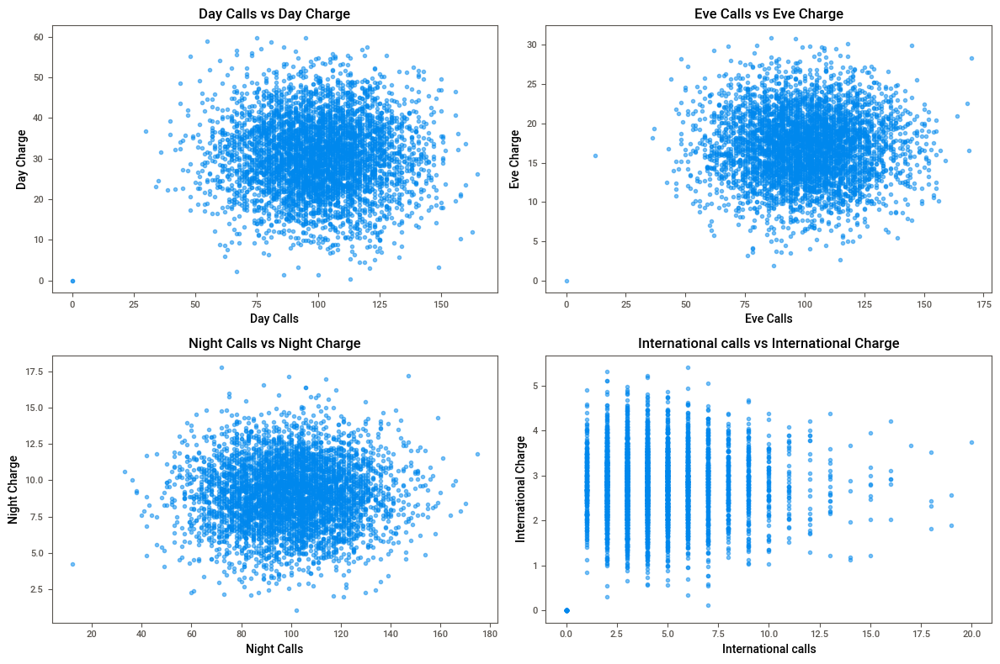

In [27]:
# Here, We are defining lists of call-related and charge-related columns.
calls_columns = ['Day Calls', 'Eve Calls', 'Night Calls', 'International calls']
charge_columns = ['Day Charge', 'Eve Charge', 'Night Charge', 'International Charge']

# Setting the figure size of the entire figure to 12*8 inches.
plt.figure(figsize=(12, 8))

# Creating subplots for each pair of call and charge columns.
for i in range(len(calls_columns)):
    
    # Creating a subplot in a 2*2 grid.
    plt.subplot(2, 2, i+1)
    
    # Creating a scatter plot for the i-th pair of call and charge columns.
    plt.scatter(data[calls_columns[i]], data[charge_columns[i]], alpha=0.5)
    
    # Setting the tittle with the name of "calls_columns" VS "charge_columns".
    plt.title(f'{calls_columns[i]} vs {charge_columns[i]}')
    
    # Setting x-axis label with the name of the call column.
    plt.xlabel(calls_columns[i])
    
    # Setting y-axis label with the name of the charge column.
    plt.ylabel(charge_columns[i])

# Adjusting layout to prevent overlapping of subplots.
plt.tight_layout()

# Displaying the plot.
plt.show()

### 2. Scatter plot for 'mins_columns' and 'charge_column':-

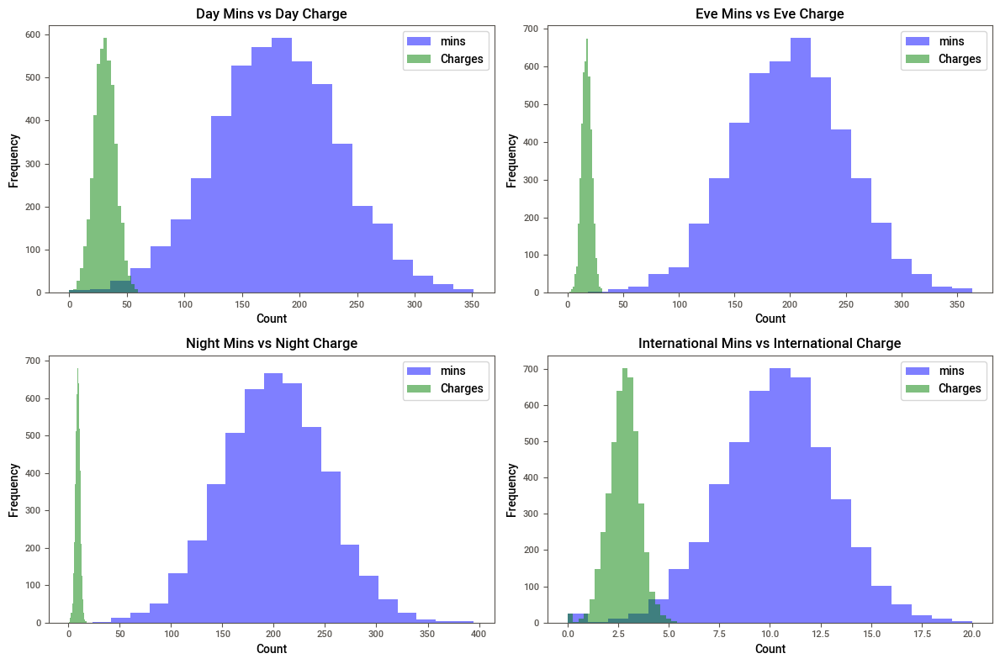

In [28]:
# Setting the size of the entire figure to 12*8 inches.
plt.figure(figsize=(12, 8))

# Defining lists of minutes-related and charge-related columns.
mins_columns = ['Day Mins', 'Eve Mins', 'Night Mins', 'International Mins']
charge_columns = ['Day Charge', 'Eve Charge', 'Night Charge', 'International Charge']

# Creating subplots for each pair of minutes and charge columns.
for i in range(len(calls_columns)):
    
    # Creating a subplot in a 2*2 grid.
    plt.subplot(2, 2, i+1)
    
    # Creating histogram for minutes and charges, using 20 bins for better distribution visualization.
    plt.hist(data[mins_columns[i]], bins=20, alpha=0.5, label='mins', color='blue')
    plt.hist(data[charge_columns[i]], bins=20, alpha=0.5, label='Charges', color='green')
   
    # set the subplot title with the names of the minutes and charge columns.
    plt.title(f'{mins_columns[i]} vs {charge_columns[i]}')
    
    # Adding labels to the x amd y axes.
    plt.xlabel('Count')
    plt.ylabel('Frequency')
    
    # Adding a legend to differentiate between minutes and charges.
    plt.legend()

# Adjusting layout to prevent overlapping of subplots.
plt.tight_layout()

# Displaying the plot.
plt.show()

### 3. Calculating Average cost per minute:-

In [29]:
# Calculating the cost per minute for each usage type.
cost_per_minute_day = data['Day Charge'] / data['Day Mins']
cost_per_minute_evening = data['Eve Charge'] / data['Eve Mins']
cost_per_minute_night = data['Night Charge'] / data['Night Mins']
cost_per_minute_international = data['International Charge'] / data['International Mins']

# Calculating the average cost per minute for each usage type.
average_cost_day = cost_per_minute_day.mean()
average_cost_evening = cost_per_minute_evening.mean()
average_cost_night = cost_per_minute_night.mean()
average_cost_international = cost_per_minute_international.mean()

# Printing the results.
print(f'Average Cost per Minute (Day): {average_cost_day:.2f}')
print(f'Average Cost per Minute (Evening): {average_cost_evening:.2f}')
print(f'Average Cost per Minute (Night): {average_cost_night:.2f}')
print(f'Average Cost per Minute (International): {average_cost_international:.2f}')

Average Cost per Minute (Day): 0.17
Average Cost per Minute (Evening): 0.09
Average Cost per Minute (Night): 0.05
Average Cost per Minute (International): 0.27


### Insights:

>- From this information, it's clear that these values shouldn't be combined together because they can have a big impact on predicting whether a customer is likely to leave or not. Each value seems to tell us something important on its own.







# 5.3. Multivariate:
>- Analysing multiple variables.

>- In Multivariate, We only do pairplot and don't write analysis.

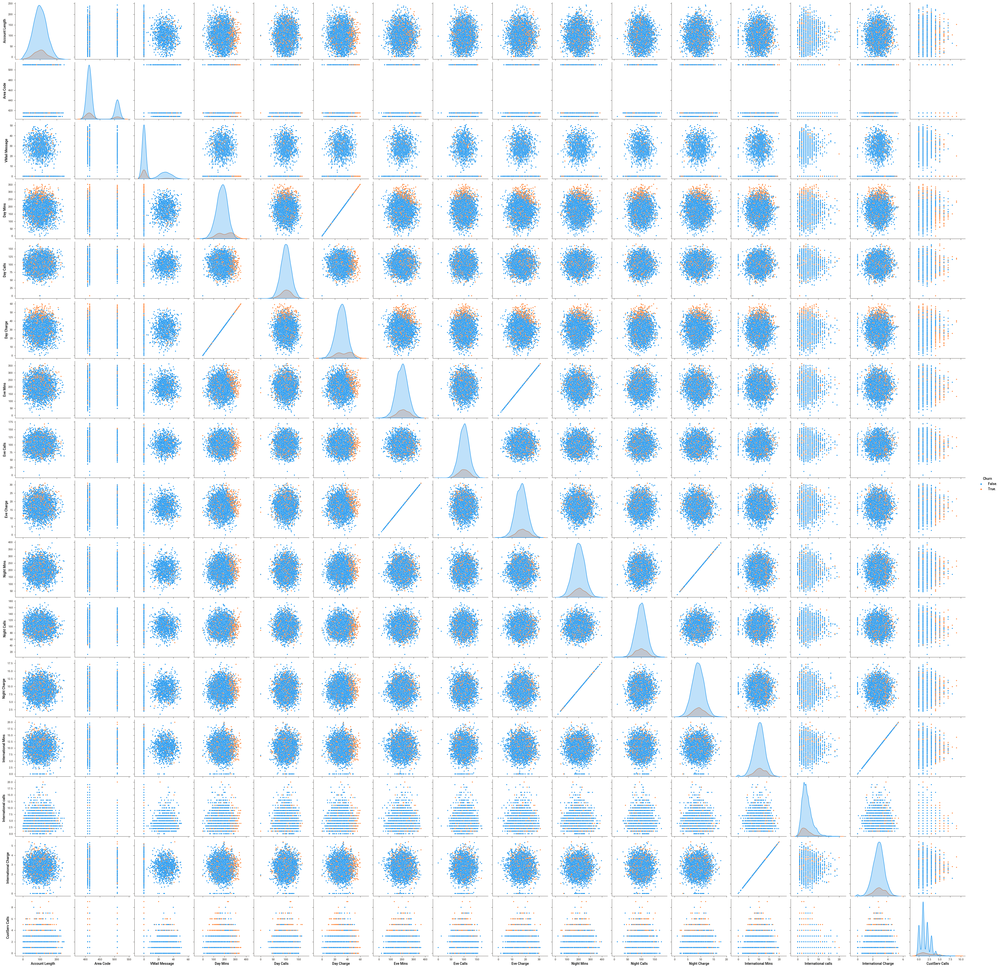

In [30]:
# We can double click on graph to zoom it and see clearly.
# It will give all the pairplot except target column.


# Visualizing dataset pattern with Seaborn pairplot.
# 'hue' : It colors the plot by the 'churn' column.
# 'daig_kind' : It shows kernal density estimates on diagonals.
sns.pairplot(data, hue='Churn', diag_kind='kde')


# Displaying the plot.
plt.show()

# 6. Data Preprocessing:

## 6.1. Null values:

In [31]:
# Checking and summing up the missing values in 'data' DataFrame.

# Displaying the count of missing value for each column.

data.isnull().sum()

State                   0
Account Length          0
Area Code               0
Phone                   0
International Plan      0
VMail Plan              0
VMail Message           0
Day Mins                0
Day Calls               0
Day Charge              0
Eve Mins                0
Eve Calls               0
Eve Charge              0
Night Mins              0
Night Calls             0
Night Charge            0
International Mins      0
International calls     0
International Charge    0
CustServ Calls          0
Churn                   0
dtype: int64

**Insights :**
>- There are no missing values.

**Handling Missing Values:**
If there are missing values in numerical data:

* For normal data, we'll replace the missing values with the mean.
* For skewed or non-normal data, we'll use the median for replacement.
* If there are missing values in categorical data:

We'll replace the missing values with the mode.

## 6.2. Duplicated Values:

In [32]:
# Checking and counting duplicated rows in 'data' DataFrame.

# Displaying the count of duplicated rows in the DataFrame.
data.duplicated().sum()

0

**Insights :**
>- There are no duplicate values in this dataset.

In [33]:
cat_col.head()

,State,Phone,International Plan,VMail Plan,Churn
0,KS,382-4657,no,yes,False.
1,OH,371-7191,no,yes,False.
2,NJ,358-1921,no,no,False.
3,OH,375-9999,yes,no,False.
4,OK,330-6626,yes,no,False.


## 6.3. Conversion of  Categorical variables:

### 1. State:

In [34]:
# Fetching the unique values for State:
data.State.unique()

array(['KS', 'OH', 'NJ', 'OK', 'AL', 'MA', 'MO', 'LA', 'WV', 'IN', 'RI',
       'IA', 'MT', 'NY', 'ID', 'VT', 'VA', 'TX', 'FL', 'CO', 'AZ', 'SC',
       'NE', 'WY', 'HI', 'IL', 'NH', 'GA', 'AK', 'MD', 'AR', 'WI', 'OR',
       'MI', 'DE', 'UT', 'CA', 'MN', 'SD', 'NC', 'WA', 'NM', 'NV', 'DC',
       'KY', 'ME', 'MS', 'TN', 'PA', 'CT', 'ND'], dtype=object)

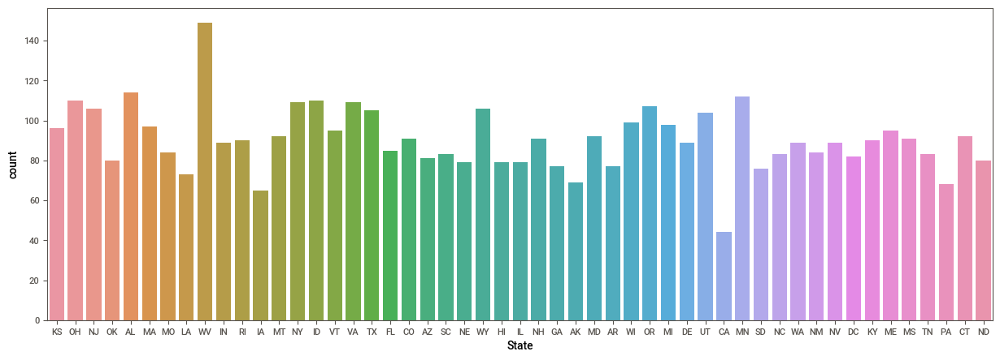

In [35]:
# Setting the size of the entire figure to 15*5 inches.
plt.figure(figsize=(15,5))

# Creating a Count plot for State columns.
sns.countplot(data=data, x= "State")

# It will display the plot.
plt.show()

In [36]:
# Fetching the value counts for State:
data.State.value_counts()

WV    149
AL    114
MN    112
OH    110
ID    110
VA    109
NY    109
OR    107
NJ    106
WY    106
TX    105
UT    104
WI     99
MI     98
MA     97
KS     96
VT     95
ME     95
CT     92
MD     92
MT     92
MS     91
NH     91
CO     91
KY     90
RI     90
NV     89
IN     89
DE     89
WA     89
FL     85
NM     84
MO     84
SC     83
NC     83
TN     83
DC     82
AZ     81
ND     80
OK     80
HI     79
NE     79
IL     79
AR     77
GA     77
SD     76
LA     73
AK     69
PA     68
IA     65
CA     44
Name: State, dtype: int64

In [37]:
# LabelEncoder:
from sklearn.preprocessing import LabelEncoder #importing label encoder from sklearn
lb = LabelEncoder()

In [38]:
#applying label encoder to  State:
data.State = lb.fit_transform(data.State)

In [39]:
# Head
data.head()

,State,Account Length,Area Code,Phone,International Plan,VMail Plan,VMail Message,Day Mins,Day Calls,Day Charge,Eve Mins,Eve Calls,Eve Charge,Night Mins,Night Calls,Night Charge,International Mins,International calls,International Charge,CustServ Calls,Churn
0,16,128,415,382-4657,no,yes,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1,False.
1,35,107,415,371-7191,no,yes,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,False.
2,31,137,415,358-1921,no,no,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,False.
3,35,84,408,375-9999,yes,no,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,False.
4,36,75,415,330-6626,yes,no,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,False.


### 2. International Plan:

In [40]:
# Fetching the unique values for International Plan:
data["International Plan"].unique()

array([' no', ' yes'], dtype=object)

In [41]:
# Fetching the values counts for International Plan:
data["International Plan"].value_counts()

 no     4171
 yes     446
Name: International Plan, dtype: int64

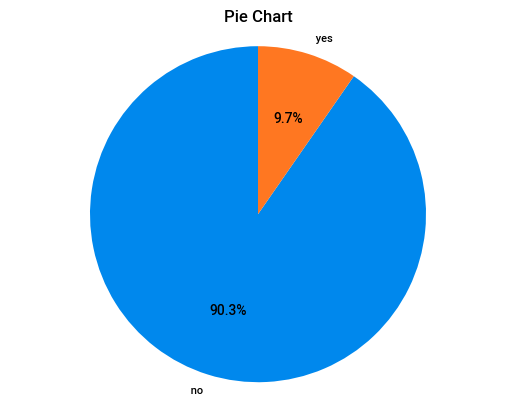

In [42]:
import matplotlib.pyplot as plt

# Sample data
labels = [' no', ' yes']
sizes = [4171, 446]  # Example values, you can replace these with your data

# Create a pie chart
plt.pie(sizes, labels=labels, autopct='%1.1f%%', startangle=90)
plt.title('Pie Chart')
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle

# Show the plot
plt.show()


In [43]:
#applying label encoder to  State:
data["International Plan"] = lb.fit_transform(data["International Plan"])

# Head:
data["International Plan"].head()

0    0
1    0
2    0
3    1
4    1
Name: International Plan, dtype: int32

### 3. VMail Plan:

In [44]:
# Fetching the unique values for VMail Plan:
data["VMail Plan"].unique()

array([' yes', ' no'], dtype=object)

In [45]:
# Fetching the value counts for VMail Plan:
data["VMail Plan"].value_counts()

 no     3381
 yes    1236
Name: VMail Plan, dtype: int64

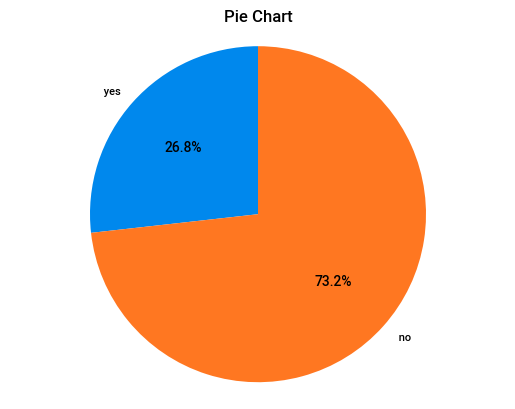

In [46]:
import matplotlib.pyplot as plt

# Sample data
labels =[' yes', ' no']
sizes = [1236, 3381]  # Example values, you can replace these with your data

# Create a pie chart
plt.pie(sizes, labels=labels, autopct='%1.1f%%', startangle=90)
plt.title('Pie Chart')
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle

# Show the plot
plt.show()


In [47]:
#applying label encoder to  VMail Plan:
data["VMail Plan"]= lb.fit_transform(data["VMail Plan"])
data["VMail Plan"].head()

0    1
1    1
2    0
3    0
4    0
Name: VMail Plan, dtype: int32

### 4. Churn:

In [48]:
# Fetching the unique values for Churn:
data["Churn"].unique()

array([' False.', ' True.'], dtype=object)

In [49]:
# Fetching the value counts for Churn:
data["Churn"].value_counts()

 False.    3961
 True.      656
Name: Churn, dtype: int64

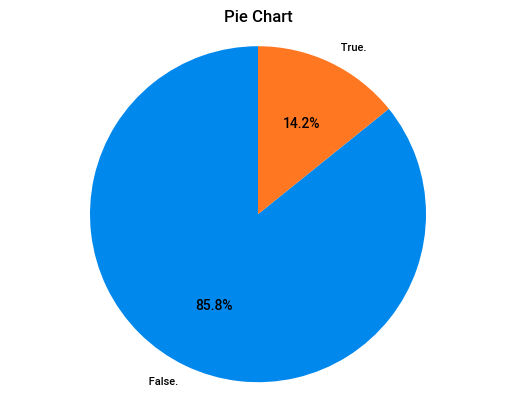

In [50]:
import matplotlib.pyplot as plt

# Sample data
labels =[' False.', ' True.']
sizes = [3961, 656]  # Example values, you can replace these with your data

# Create a pie chart
plt.pie(sizes, labels=labels, autopct='%1.1f%%', startangle=90)
plt.title('Pie Chart')
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle

# Show the plot
plt.show()


In [51]:
#applying label encoder to  VMail Plan:
data["Churn"]= lb.fit_transform(data["Churn"])
data["Churn"]

0       0
1       0
2       0
3       0
4       0
5       0
6       0
7       0
8       0
9       0
10      1
11      0
12      0
13      0
14      0
15      1
16      0
17      0
18      0
19      0
20      0
21      1
22      0
23      0
24      0
25      0
26      0
27      0
28      0
29      0
30      0
31      0
32      0
33      1
34      0
35      0
36      0
37      0
38      0
39      0
40      0
41      1
42      0
43      0
44      0
45      0
46      0
47      0
48      1
49      0
50      0
51      0
52      0
53      0
54      1
55      0
56      0
57      1
58      0
59      0
60      0
61      0
62      0
63      0
64      0
65      0
66      0
67      0
68      0
69      1
70      0
71      0
72      0
73      0
74      0
75      0
76      1
77      1
78      0
79      0
80      0
81      0
82      0
83      0
84      1
85      0
86      1
87      0
88      0
89      1
90      0
91      1
92      0
93      0
94      0
95      0
96      0
97      0
98      1
99      1


# 7. Feature Engieering:
## 7.1. Correlation:

In [52]:
# Check for multicollinearity.
data.corr()

,State,Account Length,Area Code,International Plan,VMail Plan,VMail Message,Day Mins,Day Calls,Day Charge,Eve Mins,Eve Calls,Eve Charge,Night Mins,Night Calls,Night Charge,International Mins,International calls,International Charge,CustServ Calls,Churn
State,1.000000,0.008638,0.015370,0.009789,-0.033323,-0.028491,0.009172,-0.008418,0.009173,0.002927,-0.010696,0.002920,0.014747,-0.002134,0.014735,-0.017423,0.012466,-0.017464,-0.016943,0.010979
Account Length,0.008638,1.000000,-0.020394,0.013948,-0.004602,-0.012983,0.002002,0.032783,0.001999,-0.006778,0.015598,-0.006775,-0.002077,-0.009482,-0.002095,0.003483,0.023485,0.003501,0.002620,0.018046
Area Code,0.015370,-0.020394,1.000000,0.039263,-0.003150,-0.002597,-0.018900,-0.013179,-0.018903,0.011513,-0.011528,0.011533,0.002794,0.015316,0.002782,-0.007292,-0.011531,-0.007386,0.021046,0.011995
International Plan,0.009789,0.013948,0.039263,1.000000,0.009278,0.011596,0.028220,0.007477,0.028223,0.023740,0.003360,0.023740,-0.025951,0.007390,-0.025959,0.036973,0.006717,0.036955,-0.012846,0.257524
VMail Plan,-0.033323,-0.004602,-0.003150,0.009278,1.000000,0.955280,0.004444,-0.005738,0.004441,0.021775,-0.005534,0.021779,0.006431,0.008468,0.006426,0.005872,-0.000043,0.005912,-0.014544,-0.110149
VMail Message,-0.028491,-0.012983,-0.002597,0.011596,0.955280,1.000000,0.009028,-0.003846,0.009025,0.017872,-0.006508,0.017878,0.004672,0.000889,0.004665,0.005167,0.007423,0.005202,-0.006951,-0.096884
Day Mins,0.009172,0.002002,-0.018900,0.028220,0.004444,0.009028,1.000000,-0.002823,1.000000,-0.010260,0.012990,-0.010268,0.009604,0.005165,0.009591,-0.012314,0.000166,-0.012261,-0.008149,0.202439
Day Calls,-0.008418,0.032783,-0.013179,0.007477,-0.005738,-0.003846,-0.002823,1.000000,-0.002821,-0.006430,0.003923,-0.006429,0.010730,-0.013299,0.010724,0.012951,0.010889,0.013055,-0.008747,0.016268
Day Charge,0.009173,0.001999,-0.018903,0.028223,0.004441,0.009025,1.000000,-0.002821,1.000000,-0.010255,0.012992,-0.010262,0.009606,0.005164,0.009593,-0.012315,0.000163,-0.012262,-0.008155,0.202434
Eve Mins,0.002927,-0.006778,0.011513,0.023740,0.021775,0.017872,-0.010260,-0.006430,-0.010255,1.000000,0.001135,1.000000,-0.018830,0.014226,-0.018837,0.000165,0.005749,0.000172,-0.015598,0.087042


# Heatmap:-

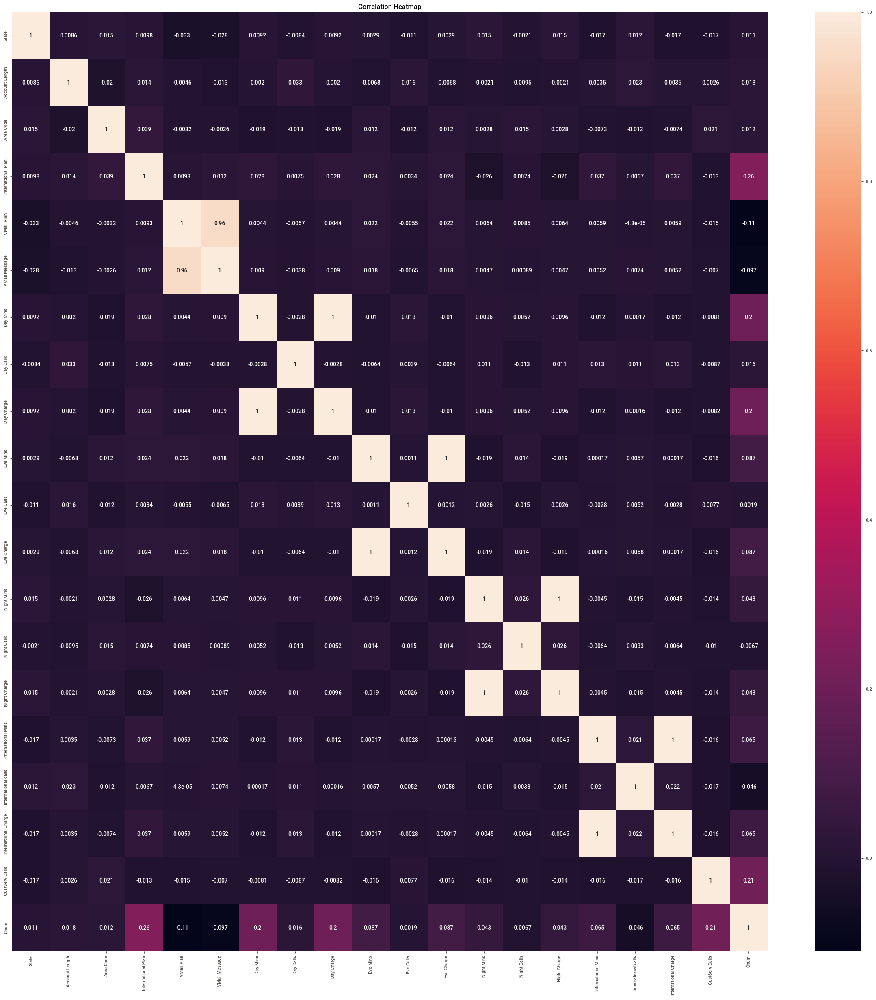

In [53]:
# it will set the figure size of the heatmpa.
plt.figure(figsize=(30,30))

# It will create large heatmap to visualize the correlation matrix of 'data1'.
# 'annot = True' : It displays the correlation values in each cell.
sns.heatmap(data.corr(), annot=True)

# It will set the title of the heatmap.
plt.title("Correlation Heatmap")

# It will display the plot.
plt.show()

### 1.VMail Message:-

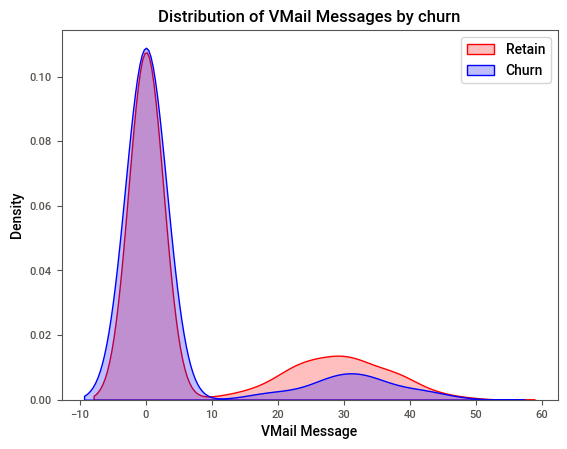

In [54]:
ax = sns.kdeplot(data[data.Churn== False]['VMail Message'],
               color = "Red", fill=True)
ax = sns.kdeplot(data[data.Churn== True]['VMail Message'],
               color = "Blue", fill=True)

# This line adds a legend to the upper right corner of the plot, labeling the red curve as "Retain" and the blue curve as "Churn."
ax.legend(["Retain", "Churn"], loc = "upper right")

# This sets the y-axis label to "Density".
ax.set_ylabel("Density")

# This sets the x-axis label to "VMail Message".
ax.set_xlabel("VMail Message")

# This sets the title of the plot to "Distribution of VMail Messages by churn."
ax.set_title("Distribution of VMail Messages by churn")

# Display the plot
plt.show()

### 2.Day Charge:-

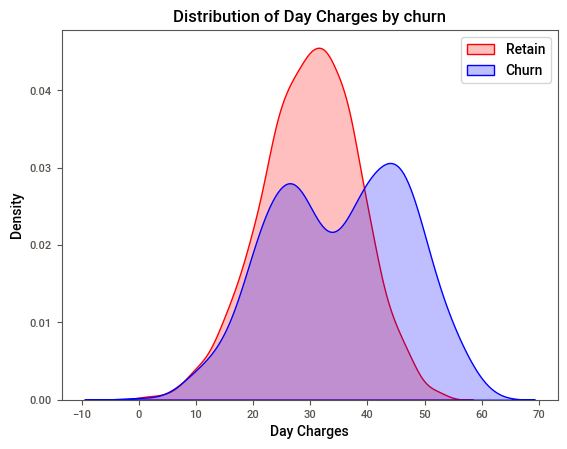

In [55]:
ax = sns.kdeplot(data[data.Churn== False]['Day Charge'],
               color = "Red", fill=True)
ax = sns.kdeplot(data[data.Churn== True]['Day Charge'],
               color = "Blue", fill=True)

# This line adds a legend to the upper right corner of the plot, labeling the red curve as "Retain" and the blue curve as "Churn."
ax.legend(["Retain", "Churn"], loc = "upper right")

# This sets the y-axis label to "Density".
ax.set_ylabel("Density")

# This sets the x-axis label to "Day Charges".
ax.set_xlabel("Day Charges")

# This sets the title of the plot to "Distribution of Day Charges by churn."
ax.set_title("Distribution of Day Charges by churn")

# Display the plot
plt.show()

### 3.Eve Charge:-

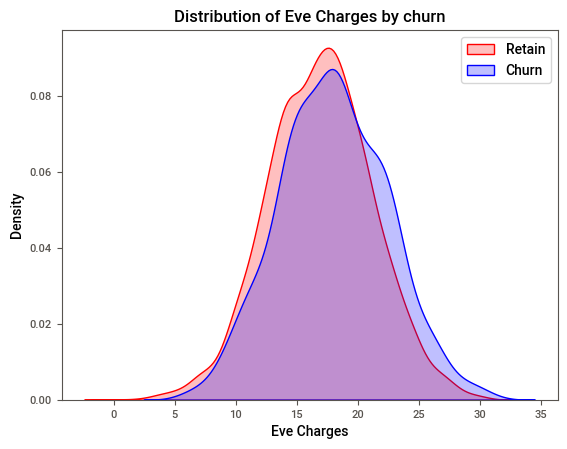

In [56]:
ax = sns.kdeplot(data[data.Churn== False]['Eve Charge'],
               color = "Red", fill=True)
ax = sns.kdeplot(data[data.Churn== True]['Eve Charge'],
               color = "Blue", fill=True)

# This line adds a legend to the upper right corner of the plot, labeling the red curve as "Retain" and the blue curve as "Churn."
ax.legend(["Retain", "Churn"], loc = "upper right")

# This sets the y-axis label to "Density".
ax.set_ylabel("Density")

# This sets the x-axis label to "Eve Charges".
ax.set_xlabel("Eve Charges")

# This sets the title of the plot to "Distribution of Eve Charges by churn."
ax.set_title("Distribution of Eve Charges by churn")

# Display the plot
plt.show()

### 4.Night Charge:-

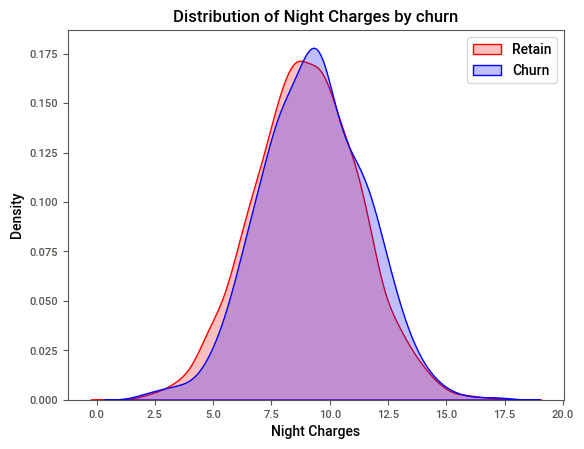

In [57]:
ax = sns.kdeplot(data[data.Churn== False]['Night Charge'],
               color = "Red", fill=True)
ax = sns.kdeplot(data[data.Churn== True]['Night Charge'],
               color = "Blue", fill=True)

# This line adds a legend to the upper right corner of the plot, labeling the red curve as "Retain" and the blue curve as "Churn."
ax.legend(["Retain", "Churn"], loc = "upper right")

# This sets the y-axis label to "Density".
ax.set_ylabel("Density")

# This sets the x-axis label to "Night Charges".
ax.set_xlabel("Night Charges")

# This sets the title of the plot to "Distribution of Night Charges by churn."
ax.set_title("Distribution of Night Charges by churn")

# Display the plot
plt.show()

### 5.International Charge:-

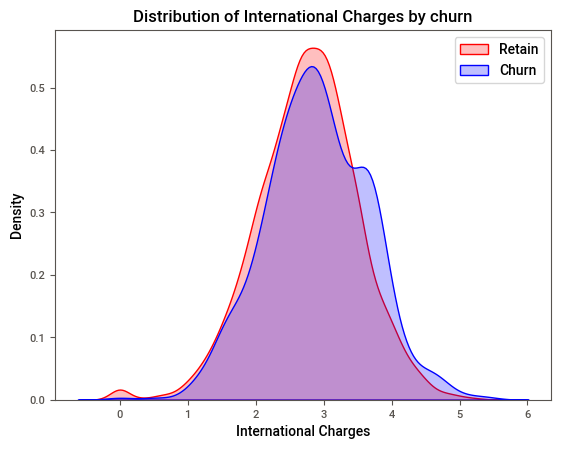

In [58]:
ax = sns.kdeplot(data[data.Churn== False]['International Charge'],
               color = "Red", fill=True)
ax = sns.kdeplot(data[data.Churn== True]['International Charge'],
               color = "Blue", fill=True)

# This line adds a legend to the upper right corner of the plot, labeling the red curve as "Retain" and the blue curve as "Churn."
ax.legend(["Retain", "Churn"], loc = "upper right")

# This sets the y-axis label to "Density".
ax.set_ylabel("Density")

# This sets the x-axis label to "International Charges".
ax.set_xlabel("International Charges")

# This sets the title of the plot to "Distribution of International Charges by churn."
ax.set_title("Distribution of International Charges by churn")

# Display the plot
plt.show()

### Insights:
>- After identifying a high correlation among certain columns, we've decided to streamline the dataset by dropping 'VMail Message,' 'Day Charge,' 'Eve Charge,' 'Night Charge,' and 'International Charge.' This move aims to address multicollinearity concerns, simplify the model's input features, and potentially enhance predictive performance. The goal is to keep the dataset focused on key, non-redundant features, optimizing the model for better interpretability and efficiency.








In [59]:
data.drop(['VMail Message','Day Charge','Eve Charge','Night Charge','International Charge','Phone'],axis=1,inplace=True)

In [60]:
data[['Day Mins','Night Mins','International Mins',"Eve Mins"]]=data[['Day Mins','Night Mins','International Mins',"Eve Mins"]].astype(np.int64)

# 8. Model Creation:

##  List of different machine learning models to try 
>- We've split our data into two sets: training and testing. Now, we're ready to create a machine learning model. The training set will be used to teach the model and recognize patterns. After that, we'll assess how well the model performs using the testing set.

>- We have selected seven different machine learning models to try :
>>-  1. `SVM Classifier`
>>-  2. `Logistic Regression`
>>-  3. `K-Nearest Neighbors Classifier`
>>-  4. `Decision Tree Classifier`
>>-  5. `Random Forest Classifier`
>>-  6. `Gradient Boosting Classifier`
>>-  7. `Xtreme Gradient Boosting Classifier`
>>-  7. `GaussianNB Naive Bayes Classifier`  



# 8.1. SVC:-
## Split data into X & Y:

In [61]:
# Here, 'x' is all the variables except target.

# Creating features(x) by dropping the "churn" column from the DataFrame.
x = data.drop("Churn", axis=1)

# Creating the target variable (y) by extracting the 'churn' column from the DataFrame. 
y = pd.DataFrame(data["Churn"])

In [62]:
# Importing the necessary module for splitting the dataset.
from sklearn.model_selection import train_test_split

# splitting the dataset into training and testing set.
# x_train : Features for training.
# x_test : Features for testing.
# y_train : Traget variable for training.
# y_test : Target variable for testing.
# test_size : The "test_size" parameter is set to 25% that means 25% of the dataset will be used for testing,
# While the remaining 75% data will be used for training.
# random_state : random_state is set to 42 for reproducibility, 
# It means if we run the code with the same random state, we will get the same split each time.

x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=0.25, random_state=89)

In [63]:
# Importing the StandardScaler from scikit-learn.
from sklearn.preprocessing import StandardScaler

# Creating an instance of StandardScaler.
scaler = StandardScaler()

# Applying standardization to x_train.
scaler.fit(x_train)
x_train = scaler.transform(x_train)
x_test = scaler.transform(x_test)


# Smote


In [64]:
# This line imports the SMOTE class from the imblearn library. 
from imblearn.over_sampling import SMOTE

# This line creates an instance of the SMOTE class and assigns it to the variable smote.
smote = SMOTE()

In [65]:
# SMOTE function is always applied on train data(x_train,y_train)
x_smote,y_smote = smote.fit_resample(x_train,y_train)

In [66]:
from collections import Counter
print("Actual class",Counter(y_train))
print("SMOTE class",Counter(y_smote))

Actual class Counter({'Churn': 1})
SMOTE class Counter({'Churn': 1})


In [67]:
# This command will upgrade the scikit-learn library to the latest version available on the Python Package Index (PyPI)
!pip install --upgrade scikit-learn

     ---------------------------------------- 11.0/11.0 MB 5.3 MB/s eta 0:00:00
     -------------------------------------- 301.8/301.8 kB 4.6 MB/s eta 0:00:00
  Attempting uninstall: threadpoolctl
    Found existing installation: threadpoolctl 2.2.0
    Uninstalling threadpoolctl-2.2.0:
      Successfully uninstalled threadpoolctl-2.2.0
  Attempting uninstall: joblib
    Found existing installation: joblib 1.1.1
    Uninstalling joblib-1.1.1:
      Successfully uninstalled joblib-1.1.1
  Attempting uninstall: scikit-learn
    Found existing installation: scikit-learn 1.2.1
    Uninstalling scikit-learn-1.2.1:
      Successfully uninstalled scikit-learn-1.2.1


In [68]:
# This command will upgrade the imbalanced-learn library to the latest version available on the Python Package Index (PyPI).
!pip install --upgrade imbalanced-learn

     -------------------------------------- 258.3/258.3 kB 1.6 MB/s eta 0:00:00
  Attempting uninstall: imbalanced-learn
    Found existing installation: imbalanced-learn 0.10.1
    Uninstalling imbalanced-learn-0.10.1:
      Successfully uninstalled imbalanced-learn-0.10.1


In [69]:
print(x_train.shape)
print(x_test.shape)
print(y_train.shape)
print(y_test.shape)

(3462, 14)
(1155, 14)
(3462, 1)
(1155, 1)


## Model Building:

In [70]:
# Support vector classifier model:
# Importing Support Vector Machine (SVM) classifier from scikit-learn.
from sklearn.svm import SVC

# Creating an instance of the svc.
svc = SVC()

# Training the svc with the training data.
svc.fit(x_smote,y_smote)

SVC()

In [71]:
# make prediction using x_test:
y_pred_svc = svc.predict(x_test)

In [72]:
# make prediction using x_train:
y_train_pred_svc = svc.predict(x_smote)

##  Evaluate the Module:

In [73]:
# Evaluating the model created:
from sklearn.metrics import accuracy_score,precision_score,recall_score,classification_report,f1_score

In [74]:
#Evaluate the accuracy score of SVC model:
svc_acc = accuracy_score(y_test,y_pred_svc)
svc_acc

0.8987012987012987

In [75]:
#Evaluate SVC model:
print("SVC training set score:" , accuracy_score(y_smote, y_train_pred_svc))
print("SVC test set score:" , accuracy_score(y_test, y_pred_svc))

SVC training set score: 0.9365984568936598
SVC test set score: 0.8987012987012987


In [76]:
# Classification Report of SVC Classifier Model
print(classification_report(y_test, y_pred_svc, target_names=
                            ["False","True"]))

              precision    recall  f1-score   support

       False       0.95      0.93      0.94       980
        True       0.65      0.71      0.68       175

    accuracy                           0.90      1155
   macro avg       0.80      0.82      0.81      1155
weighted avg       0.90      0.90      0.90      1155



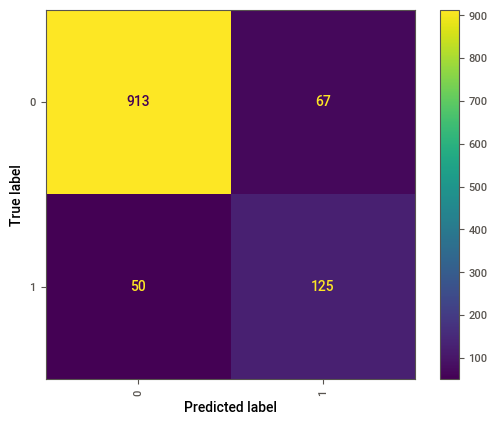

In [77]:
# Importing the ConfusionMatrixDisplay class from 'sklearn.metrics' module.
from sklearn.metrics import ConfusionMatrixDisplay

# Creating a confusion matrix display for Support Vector Classifier predictions on the test data.
ConfusionMatrixDisplay.from_predictions(y_test, y_pred_svc, xticks_rotation='vertical')

# 8.2. Logistic Regression:-

In [78]:
# import logistic regression model
from sklearn.linear_model import LogisticRegression


# initialise model
model = LogisticRegression()


# Train x and y model:
model.fit(x_smote,y_smote)

LogisticRegression()

In [79]:
# make prediction using x_test:
y_pred_lr = model.predict(x_test)
y_pred_lr

array([0, 0, 1, ..., 1, 1, 0])

In [80]:
# make prediction using x_train:
y_train_pred_lr = model.predict(x_smote)
y_train_pred_lr

array([1, 0, 0, ..., 1, 0, 1])

##  Evaluate the Module:

In [81]:
from sklearn.metrics import classification_report,accuracy_score

In [82]:
#Evaluate the accuracy score of Logistic Regression model:
lr_acc = accuracy_score(y_test,y_pred_lr)
lr_acc

0.7610389610389611

In [83]:
#Evaluate Logistic Regression model:
print("Logistic Regression training set score:" , accuracy_score(y_smote, y_train_pred_lr))
print("Logistic Regression test set score:" , accuracy_score(y_test, y_pred_lr))

Logistic Regression training set score: 0.7794364307279437
Logistic Regression test set score: 0.7610389610389611


In [84]:
# Classification Report of Tuned Logistic Regression Model
print(classification_report(y_test, y_pred_lr, target_names= ["False","True"]))

              precision    recall  f1-score   support

       False       0.95      0.76      0.84       980
        True       0.37      0.78      0.50       175

    accuracy                           0.76      1155
   macro avg       0.66      0.77      0.67      1155
weighted avg       0.86      0.76      0.79      1155



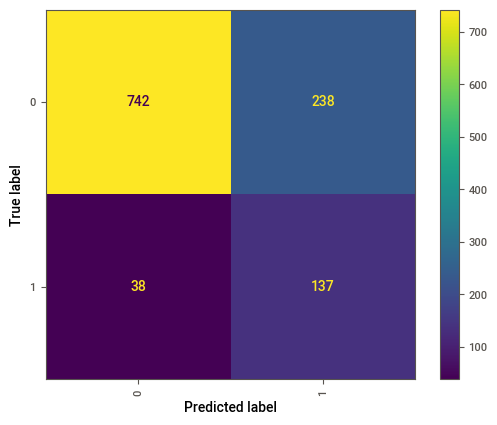

In [85]:
# Importing the ConfusionMatrixDisplay class from 'sklearn.metrics' module.
from sklearn.metrics import ConfusionMatrixDisplay

# Creating a confusion matrix display for logistic regression predictions on the test data.
ConfusionMatrixDisplay.from_predictions(y_test, y_pred_lr, xticks_rotation='vertical')

# 8.3. KNN:-

## Model Building:

In [86]:
# Using K-Nearest Neighbors (KNN) classifier to predict target values for the
from sklearn.neighbors import KNeighborsClassifier

# Creating a KNeighborsclassifier instance.
knn = KNeighborsClassifier(n_neighbors = 5)

# Training the model with the training data.
knn.fit(x_smote, y_smote)

KNeighborsClassifier()

In [87]:
# Testing accuracy:
y_pred_knn = knn.predict(x_test)

# Training accuracy:
y_train_pred_knn = knn.predict(x_smote)

##  Evaluate the Module:

In [88]:
#Evaluate the accuracy score of KNN model:
knn_acc = accuracy_score(y_test,y_pred_knn)
knn_acc

0.7783549783549784

In [89]:
#Evaluate KNN model:
print("KNN training set score:",  accuracy_score(y_smote, y_train_pred_knn))
print("KNN test set score:", accuracy_score(y_test, y_pred_knn))

KNN training set score: 0.9308956725930896
KNN test set score: 0.7783549783549784


In [90]:
# Classification Report of KNN Classifier Model
print(classification_report(y_test, y_pred_knn, target_names=
                            ["False","True"]))

              precision    recall  f1-score   support

       False       0.95      0.78      0.86       980
        True       0.38      0.75      0.51       175

    accuracy                           0.78      1155
   macro avg       0.66      0.77      0.68      1155
weighted avg       0.86      0.78      0.80      1155



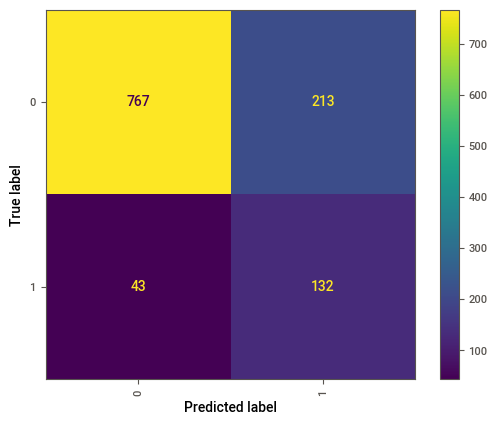

In [91]:
# Importing the ConfusionMatrixDisplay class from 'sklearn.metrics' module.
from sklearn.metrics import ConfusionMatrixDisplay

# Creating a confusion matrix display for logistic regression predictions on the test data.
ConfusionMatrixDisplay.from_predictions(y_test, y_pred_knn, xticks_rotation='vertical')

# 8.4. Decision Tree:

## Model Building:

In [92]:
# Importing DecisionTreeClassifier from the 'sklearn.tree'.
from sklearn.tree import DecisionTreeClassifier

# Creating a DecisionTreeClassifier instance.
model = DecisionTreeClassifier()

# Training the model with the training data.
model.fit(x_smote,y_smote)

DecisionTreeClassifier()

In [93]:
# make prediction using x_test:
y_pred_dtc = model.predict(x_test)

# make prediction using x_smote:
y_train_pred_dtc = model.predict(x_smote)

##  Evaluate the Module:

In [94]:
# Evaluate the accuracy_score of DTC Model:
accuracy_score(y_test,y_pred_dtc)

0.8787878787878788

In [95]:
# Evaluate DTC Model:
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, roc_auc_score
print("DTC training set score:", accuracy_score(y_smote, y_train_pred_dtc))
print("DTC test set score:",  accuracy_score(y_test, y_pred_dtc))

DTC training set score: 1.0
DTC test set score: 0.8787878787878788


## Hyper Parameter Tunning:

In [96]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import randint

# Assuming you have your feature matrix (X) and target variable (y) ready

# Define the hyperparameter space
param_dist = {
    'criterion': ['gini', 'entropy'],
    'splitter': ['best', 'random'],
    'max_depth': randint(1, 20),  # Example range for max_depth
    'min_samples_split': randint(2, 20),  # Example range for min_samples_split
    'min_samples_leaf': randint(1, 20),  # Example range for min_samples_leaf
    'max_features': ['auto', 'sqrt', 'log2', None]
}

In [97]:
# Initialize the Decision Tree Classifier model
dtc_clf = DecisionTreeClassifier(random_state=42)

# Create RandomizedSearchCV object
dtc_random_search = RandomizedSearchCV(
    estimator=dtc_clf,
    param_distributions=param_dist,
    n_iter=100,
    cv=3,
    scoring='accuracy',
    random_state=45,
    n_jobs=-1,
    verbose=2
)

In [98]:
# Fit the RandomizedSearchCV on your data
dtc_random_search.fit(x_smote, y_smote)

# Get and print the best parameters
best_params = dtc_random_search.best_params_
print(f"Best parameters: {best_params}")


Fitting 3 folds for each of 100 candidates, totalling 300 fits


exception calling callback for <Future at 0x1abe27b0fd0 state=finished raised TerminatedWorkerError>
Traceback (most recent call last):
  File "C:\Users\HP\anaconda3\lib\site-packages\joblib\externals\loky\_base.py", line 625, in _invoke_callbacks
  File "C:\Users\HP\anaconda3\lib\site-packages\joblib\parallel.py", line 360, in __call__
    n_jobs=default_parallel_config["n_jobs"],
  File "C:\Users\HP\anaconda3\lib\site-packages\joblib\parallel.py", line 797, in dispatch_next
    # main thread when calling `get_result`.
  File "C:\Users\HP\anaconda3\lib\site-packages\joblib\parallel.py", line 864, in dispatch_one_batch
    #            This method can be called either in the main thread         #
  File "C:\Users\HP\anaconda3\lib\site-packages\joblib\parallel.py", line 782, in _dispatch
  File "C:\Users\HP\anaconda3\lib\site-packages\joblib\_parallel_backends.py", line 531, in apply_async
    idle_worker_timeout=300, **memmappingexecutor_args):
  File "C:\Users\HP\anaconda3\lib\site-pa

Unexpected exception formatting exception. Falling back to standard exception


Traceback (most recent call last):
  File "C:\Users\HP\anaconda3\lib\site-packages\IPython\core\interactiveshell.py", line 3460, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "C:\Users\HP\AppData\Local\Temp\ipykernel_13548\1355344969.py", line 2, in <module>
    dtc_random_search.fit(x_smote, y_smote)
  File "C:\Users\HP\anaconda3\lib\site-packages\sklearn\model_selection\_search.py", line 874, in fit
    if _routing_enabled():
  File "C:\Users\HP\anaconda3\lib\site-packages\sklearn\model_selection\_search.py", line 1768, in _run_search
    |    'rbf'     |     0.3     |       0.70        |...|       2       |
  File "C:\Users\HP\anaconda3\lib\site-packages\sklearn\model_selection\_search.py", line 821, in evaluate_candidates
    if (
  File "C:\Users\HP\anaconda3\lib\site-packages\sklearn\utils\parallel.py", line 63, in __call__
    List of results of the tasks.
  File "C:\Users\HP\anaconda3\lib\site-packages\joblib\parallel.py", line 1061, in __call__
  Fil

In [99]:
dtc_clf2 = DecisionTreeClassifier(criterion = 'gini',
                                  max_depth = 13,
                                  max_features = None,
                                  min_samples_leaf = 2,
                                  min_samples_split = 8,
                                  splitter = 'best')   
dtc_clf2.fit(x_smote,y_smote)

DecisionTreeClassifier(max_depth=13, min_samples_leaf=2, min_samples_split=8)

In [100]:
# make prediction using x_smote:
y_train_pred_dtc_clf = dtc_clf2.predict(x_smote)

# make prediction using x_test:
y_predict_dtc_clf  =  dtc_clf2.predict(x_test)

In [101]:
# Evaluate the accuracy_score of DTC Model:
dt_acc = accuracy_score(y_test,y_predict_dtc_clf)
dt_acc

0.9168831168831169

In [102]:
#Evaluate DTC model:
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, roc_auc_score
print("DTC training set score:", accuracy_score(y_smote, y_train_pred_dtc_clf))
print("DTC test set score:",  accuracy_score(y_test, y_predict_dtc_clf))

DTC training set score: 0.9568936598456894
DTC test set score: 0.9168831168831169


In [103]:
# Classification Report of DTC Classfier Model
print(classification_report(y_test, y_predict_dtc_clf, target_names=["False","True"]))

              precision    recall  f1-score   support

       False       0.95      0.95      0.95       980
        True       0.72      0.75      0.73       175

    accuracy                           0.92      1155
   macro avg       0.84      0.85      0.84      1155
weighted avg       0.92      0.92      0.92      1155



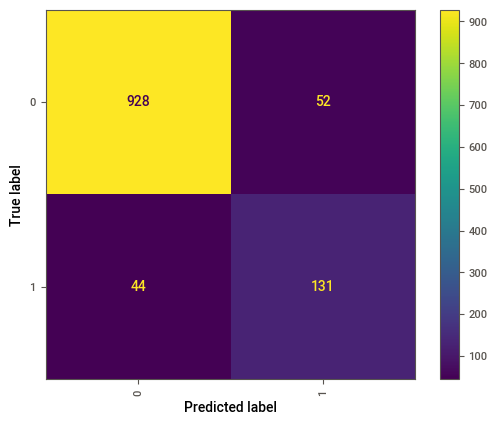

In [104]:
# Importing the ConConfusionMatrixDisplay class from 'sklearn.metrics' module.
from sklearn.metrics import ConfusionMatrixDisplay

# Creating a confusion matrix display for Decision Tree predictions on the test data.
ConfusionMatrixDisplay.from_predictions(y_test, y_predict_dtc_clf, xticks_rotation='vertical')

# 8.5. Random Forest:

## Model Building:

In [105]:
# Using Random Forest Classifier to predict target valeus for the x_test.
from sklearn.ensemble import RandomForestClassifier

# Creating an instance of RanRandomForestClassifier instance.
model = RandomForestClassifier()

# Training the model with the training data.
model.fit(x_smote,y_smote)

RandomForestClassifier()

In [106]:
# make prediction using x_test:
y_pred_rfc = model.predict(x_test)

# make prediction using x_smote:
y_train_pred_rfc = model.predict(x_smote)

##  Evaluate the Module:

In [107]:
# Evaluate the accuracy_score RFC Model:
rfc_acc = accuracy_score(y_test,y_pred_rfc)
rfc_acc

0.9298701298701298

In [108]:
# Evaluate RFC Model:
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, roc_auc_score
print("RFC training set score:", accuracy_score(y_smote, y_train_pred_rfc))
print("RFC test set score:",  accuracy_score(y_test, y_pred_rfc))

RFC training set score: 1.0
RFC test set score: 0.9298701298701298


In [109]:
# Classification Report of DTC Classfier Model
print(classification_report(y_test, y_pred_rfc, target_names=["False","True"]))

              precision    recall  f1-score   support

       False       0.96      0.96      0.96       980
        True       0.78      0.75      0.76       175

    accuracy                           0.93      1155
   macro avg       0.87      0.86      0.86      1155
weighted avg       0.93      0.93      0.93      1155



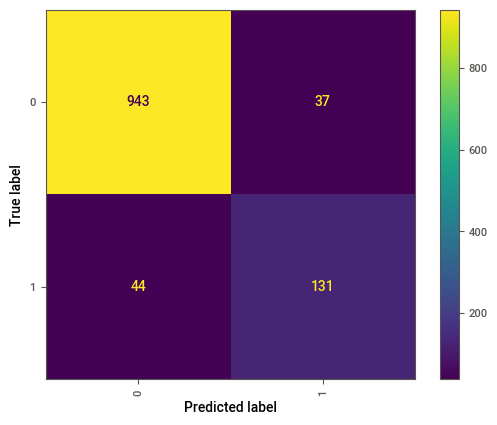

In [110]:
# Importing the ConfusionMatrixDisplay class from 'sklearn.metrics' module.
from sklearn.metrics import ConfusionMatrixDisplay

# Creating a confusion matrix display for Random Forest Classifier predictions on the test data.
ConfusionMatrixDisplay.from_predictions(y_test, y_pred_rfc, xticks_rotation='vertical')

# 8.6. Gradiant Boosting:

## Model Building:

In [111]:
# Importing GradientBoostingClassifier from 'sklearn.ensemble'.
from sklearn.ensemble import GradientBoostingClassifier

# Creating an instance of GradientBoostingClassifier instance.
gbc = GradientBoostingClassifier()

# Training the model with the training data.
gbc.fit(x_smote,y_smote)

GradientBoostingClassifier()

In [112]:
# make prediction using x_test:
y_pred_gbc = gbc.predict(x_test)

# make prediction using x_smote:
y_train_pred_gbc = gbc.predict(x_smote)

## Evaluate the Module:

In [113]:
#Evaluate the accuracy score of GBC model:
gbc_acc = accuracy_score(y_test,y_pred_gbc)
gbc_acc

0.9203463203463204

In [114]:
#Evaluate GBC model:
print("GBC training set score:", accuracy_score(y_smote,y_train_pred_gbc))
print("GBC test set score:", accuracy_score(y_test, y_pred_gbc))

GBC training set score: 0.9538745387453874
GBC test set score: 0.9203463203463204


In [115]:
# Classification Report of GBC Model
print(classification_report(y_test, y_pred_gbc, target_names=["False","True"]))

              precision    recall  f1-score   support

       False       0.96      0.95      0.95       980
        True       0.73      0.76      0.74       175

    accuracy                           0.92      1155
   macro avg       0.84      0.85      0.85      1155
weighted avg       0.92      0.92      0.92      1155



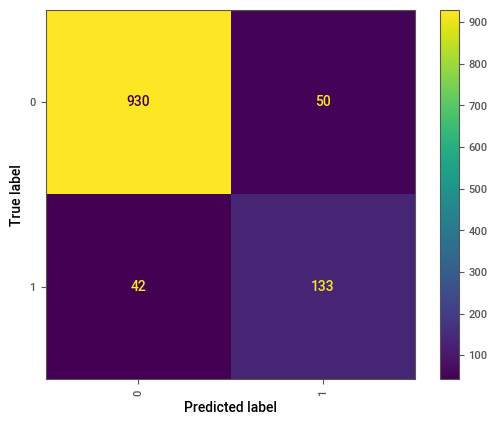

In [116]:
# Importing the ConfusionMatrixDisplay class from 'sklearn.metrics' module.
from sklearn.metrics import ConfusionMatrixDisplay

# Creating a confusion matrix display for Gradient Boosting Classifier predictions on the test data.
ConfusionMatrixDisplay.from_predictions(y_test, y_pred_gbc, xticks_rotation='vertical')

# 8.7. XG Boost Classifier:

## Model Building:

In [117]:
## Installing XGB library
! pip install xgboost

In [117]:
import xgboost as xgb

In [118]:
# Importing the XGBClassifier fromthe xgboost library.
from xgboost import XGBClassifier

# Creating a XGBClassifier instance.
xgb = XGBClassifier() 

# Training the model with the training data.
xgb.fit(x_smote,y_smote)

XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
              importance_type=None, interaction_constraints='',
              learning_rate=0.300000012, max_bin=256, max_cat_to_onehot=4,
              max_delta_step=0, max_depth=6, max_leaves=0, min_child_weight=1,
              missing=nan, monotone_constraints='()', n_estimators=100,
              n_jobs=0, num_parallel_tree=1, predictor='auto', random_state=0,
              reg_alpha=0, reg_lambda=1, ...)

In [119]:
# make prediction using x_test:
y_pred_xgb = gbc.predict(x_test)

# make prediction using x_smote:
y_train_pred_xgb = gbc.predict(x_smote)

## Evaluate the Module:

In [120]:
#Evaluate the accuracy score of XGB model:
xgb_acc = accuracy_score(y_test,y_pred_xgb)
xgb_acc

0.9203463203463204

In [122]:
#Evaluate XGB model:
print("XBG training set score:", accuracy_score(y_smote,y_train_pred_xgb))
print("XGB test set score:", accuracy_score(y_test, y_pred_xgb))

XBG training set score: 0.9538745387453874
XGB test set score: 0.9203463203463204


In [123]:
# Classification Report of XGB Model :
print(classification_report(y_test, y_pred_xgb, target_names=["False","True"]))

              precision    recall  f1-score   support

       False       0.96      0.95      0.95       980
        True       0.73      0.76      0.74       175

    accuracy                           0.92      1155
   macro avg       0.84      0.85      0.85      1155
weighted avg       0.92      0.92      0.92      1155



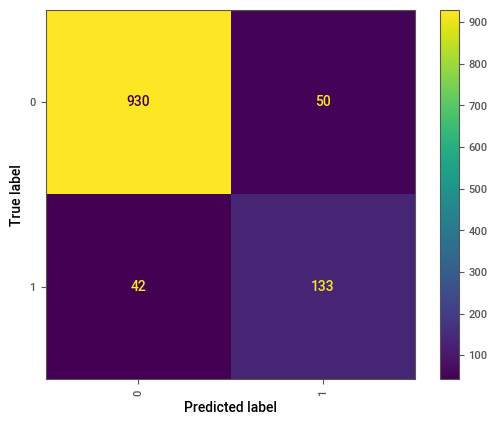

In [124]:
# Importing the ConfusionMatrixDisplay class from 'sklearn.metrics' module.
from sklearn.metrics import ConfusionMatrixDisplay

# Creating a confusion matrix display for  XGBClassifier predictions on the test data.
ConfusionMatrixDisplay.from_predictions(y_test, y_pred_xgb, xticks_rotation='vertical')

# 8.8. Naive Bayes:

## Model Building:

In [125]:
# Importing the GaussianNB from the naive_bayes library.
from sklearn.naive_bayes import GaussianNB

# Creating a GaussianNB instance.
nb = GaussianNB()

# Training the model with the training data.
nb.fit(x_smote,y_smote)

ImportError: cannot import name '_fit_context' from 'sklearn.base' (C:\Users\HP\anaconda3\lib\site-packages\sklearn\base.py)

In [126]:
# make prediction using x_test:
y_pred_nb = gbc.predict(x_test)

# make prediction using x_smote:
y_train_pred_nb = gbc.predict(x_smote)

In [127]:
#Evaluate the accuracy_score of naive_Bayes model:
nb_acc = accuracy_score(y_test,y_pred_nb)
nb_acc

0.9203463203463204

In [129]:
#Evaluate naive_Bayes model:
print("naive_Bayes training set score:", accuracy_score(y_smote,y_train_pred_nb))
print("naive_Bayes test set score:", accuracy_score(y_test, y_pred_nb))

naive_Bayes training set score: 0.9538745387453874
naive_Bayes test set score: 0.9203463203463204


In [128]:
# Classification Report of naive_Bayes Model:
print(classification_report(y_test, y_pred_nb, target_names=["False","True"]))

              precision    recall  f1-score   support

       False       0.96      0.96      0.96       980
        True       0.76      0.78      0.77       175

    accuracy                           0.93      1155
   macro avg       0.86      0.87      0.86      1155
weighted avg       0.93      0.93      0.93      1155



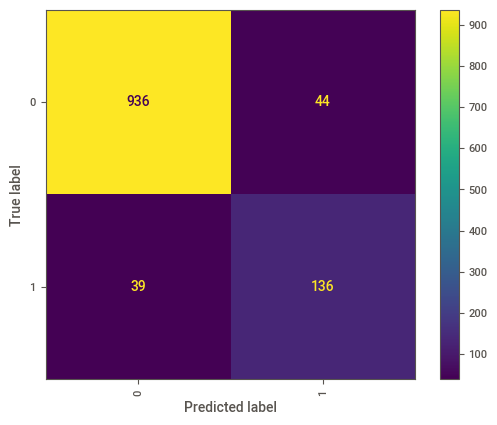

In [129]:
# Importing the ConfusionMatrixDisplay class from 'sklearn.metrics' module.
from sklearn.metrics import ConfusionMatrixDisplay

# Creating a confusion matrix display for  naive_Bayes predictions on the test data.
ConfusionMatrixDisplay.from_predictions(y_test, y_pred_nb, xticks_rotation='vertical')

In [130]:
Model_Comparison= pd.DataFrame({'Model':['Support Vector Classifier(Tuned)',
                                         'Logistic Regressor ()',
                                         'KNN Classifier (Tuned)',
                                         'Decision Tree Classifier()',
                                         'Random Forest Classifier',
                                         'Gradient Boosting Classifier()',
                                         'XG Boosting Classifier()',
                                         'GaussianNB Naive Bayes Classifier()',
                                         ],

                                'Train Score':[accuracy_score(y_smote, y_train_pred_svc),
                                               accuracy_score(y_smote, y_train_pred_lr),
                                               accuracy_score(y_smote, y_train_pred_knn),
                                               accuracy_score(y_smote, y_train_pred_dtc_clf),
                                               accuracy_score(y_smote, y_train_pred_rfc),
                                               accuracy_score(y_smote, y_train_pred_gbc),
                                               accuracy_score(y_smote, y_train_pred_xgb),
                                               accuracy_score(y_smote, y_train_pred_nb),
                                               ],
                                'Test Score':[accuracy_score(y_test, y_pred_svc),
                                              accuracy_score(y_test, y_pred_lr),
                                              accuracy_score(y_test, y_pred_knn),
                                              accuracy_score(y_test, y_predict_dtc_clf),
                                              accuracy_score(y_test, y_pred_rfc),
                                              accuracy_score(y_test, y_pred_gbc),
                                              accuracy_score(y_test, y_pred_xgb),
                                              accuracy_score(y_test, y_pred_nb),
                                              ]})
Model_Comparison.index+=1
Model_Comparison

,Model,Train Score,Test Score
1,Support Vector Classifier(Tuned),0.937773,0.898701
2,Logistic Regressor (),0.783965,0.759307
3,KNN Classifier (Tuned),0.928212,0.781818
4,Decision Tree Classifier(),0.974170,0.917749
5,Random Forest Classifier,1.000000,0.927273
6,Gradient Boosting Classifier(),0.963100,0.928139
7,XG Boosting Classifier(),0.963100,0.928139
8,GaussianNB Naive Bayes Classifier(),0.963100,0.928139


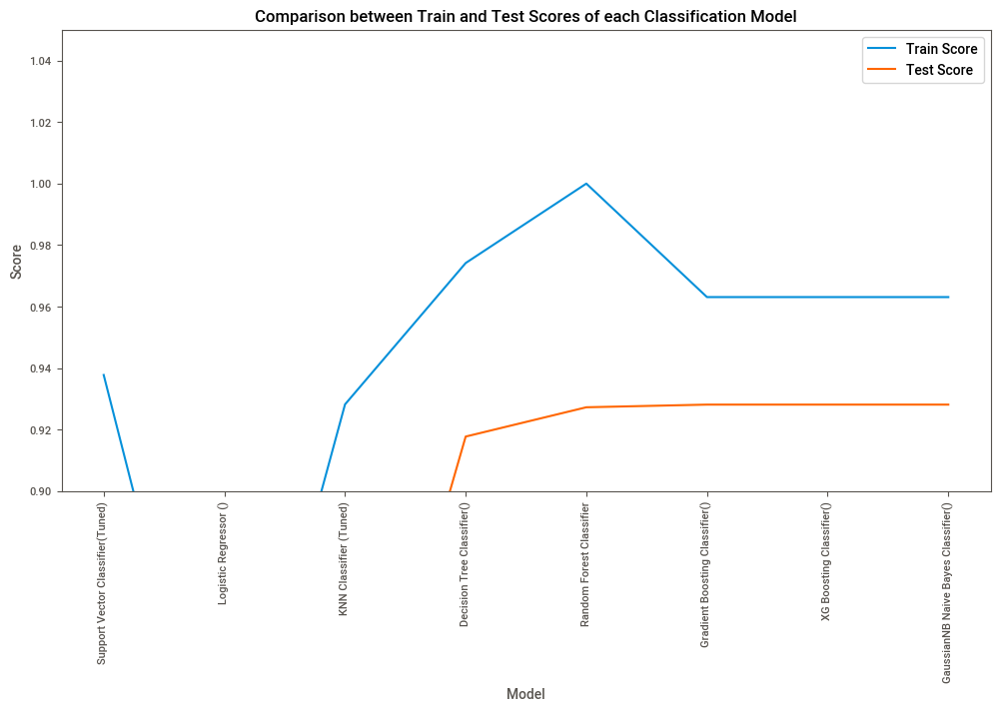

In [131]:
import matplotlib.pyplot as plt

# Extracting model names, train scores, and test scores from the DataFrame.
model_names = Model_Comparison['Model'].tolist()
train_scores = Model_Comparison['Train Score'].tolist()
test_scores = Model_Comparison['Test Score'].tolist()

# Here, We are setting up the size of the plot.
plt.figure(figsize=(12,6))

# Plot the data
# Plotting the train scores for each model with blue color.
plt.plot(model_names, train_scores, label='Train Score', color='#0590DA')

# Plotting the test scores for each model with orange color.
plt.plot(model_names, test_scores, label='Test Score', color='#FF6600')

# Adding a Legend to the plot.
plt.legend()

# Rotatingx-axis labels for better readability.
plt.xticks(rotation=90)

# Adding Labels to the x and y axes.
plt.xlabel('Model')
plt.ylabel('Score')

# Setting y-axis limits for better visualization.
plt.ylim(0.900, 1.05)

# Adding a 'title' to the plot.
plt.title('Comparison between Train and Test Scores of each Classification Model')

# Displaying the plot.
plt.show()

In [132]:
scores = [lr_acc,knn_acc,rfc_acc,dt_acc,gbc_acc,xgb_acc,nb_acc,svc_acc]
algorithms = ["Logistic Regressor","KNN Classifier","Random Forest Classifier","Decision Tree Classifier",
              "Gradient Boosting Classifier","XG Boosting Classifier","GaussianNB Naive Bayes Classifier","Support Vector Classifier"]    

for i in range(len(algorithms)):
    print("The R2 score achieved using "+algorithms[i]+" is: "+str(scores[i])+" %")

The R2 score achieved using Logistic Regressor is: 0.7593073593073593 %
The R2 score achieved using KNN Classifier is: 0.7818181818181819 %
The R2 score achieved using Random Forest Classifier is: 0.9272727272727272 %
The R2 score achieved using Decision Tree Classifier is: 0.9177489177489178 %
The R2 score achieved using Gradient Boosting Classifier is: 0.9281385281385282 %
The R2 score achieved using XG Boosting Classifier is: 0.9281385281385282 %
The R2 score achieved using GaussianNB Naive Bayes Classifier is: 0.9281385281385282 %
The R2 score achieved using Support Vector Classifier is: 0.8987012987012987 %


(array([0, 1, 2, 3, 4, 5, 6, 7]),
 [Text(0, 0, 'Logistic Regressor'),
  Text(1, 0, 'KNN Classifier'),
  Text(2, 0, 'Random Forest Classifier'),
  Text(3, 0, 'Decision Tree Classifier'),
  Text(4, 0, 'Gradient Boosting Classifier'),
  Text(5, 0, 'XG Boosting Classifier'),
  Text(6, 0, 'GaussianNB Naive Bayes Classifier'),
  Text(7, 0, 'Support Vector Classifier')])

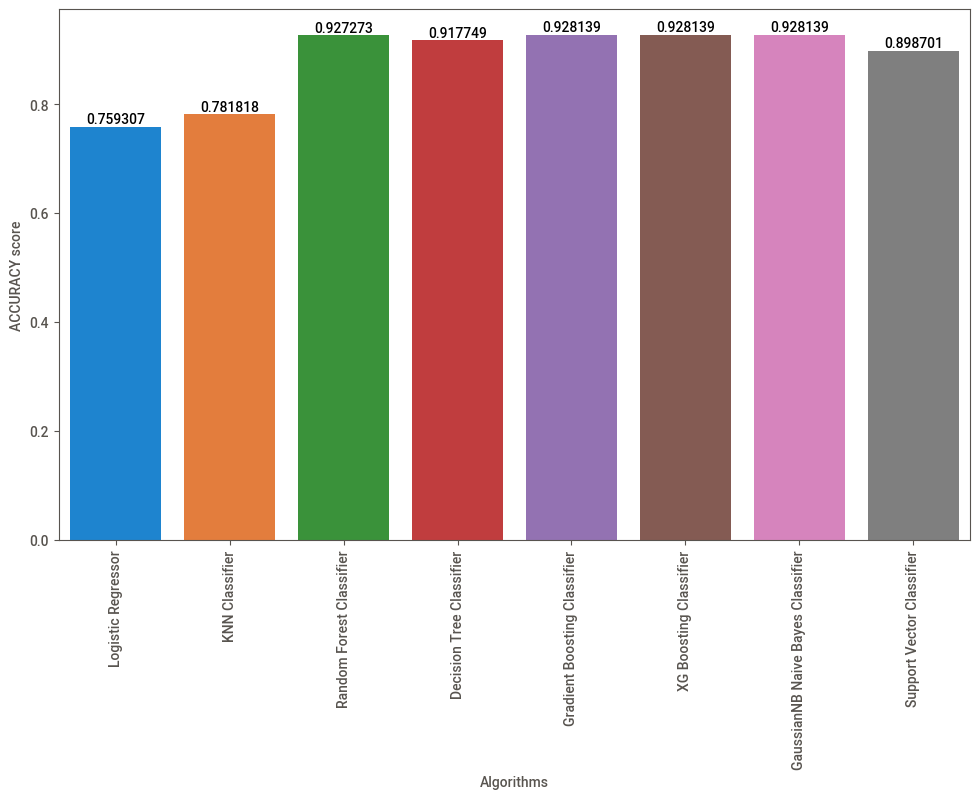

In [133]:
# Here, We are setting the figure size of the plot.
plt.figure(figsize=(10,6))

# Adding labels to the axes.
plt.xlabel("Algorithms")
plt.ylabel("ACCURACY score")

# Using seaborn to creat a bar plot.
ax=sns.barplot(x=algorithms,y=scores)

# Adding labels to the each bar in the plot.
for label in ax.containers:
    ax.bar_label(label)
    
# Ensuring tight layout for a clean presentation.
plt.tight_layout()

# it will rotate the x-tick labels by 90 degree for better readability.
plt.tick_params(labelsize=10)

# It will display the plot.
plt.xticks(rotation=90)

#  PROJECT SUMMARY :

### Variables influencing the customers to migrate :

**1. Customer Service Calls:**

>- Investigate reasons behind customer departure by examining issues during their support calls.

**2. International Calls:**

>- Reviewing the pricing structure for international calls during different time periods.

**3. Day and Evening Charges:**

>- Implementing special promotions with reduced rates, particularly during peak usage times.

**4. Customer Feedback:**


>- Gathering customer opinions on our pricing to identify concerns.

>- Emphasizing the advantages of various services and plans to provide a rationale for the charges.








# CONCLUSION :

**Model Performance:**
>- After analyzing the results, it's evident that Random Forest Classification, GaussianNB Naive Bayes Classifier, Gradient Boosting Classifier, and XGBOOST Classification consistently achieved high accuracy scores of 0.928 and 0.927.

**Best Performing Model:**
>- Among these models, the GaussianNB Naive Bayes Classifier, Gradient Boosting Classifier, and XGBOOST Classification stood out with an impressive accuracy of 92.8%, making it the top-performing model for predicting customer churn.


**Recommendations for No-Churn Telecom:**
\

**Utilizing Churn_Flag for Targeted Campaigns:**
>- The newly introduced Churn_Flag column can serve as a valuable tool for creating targeted campaigns. These campaigns can be designed to encourage customers flagged for potential churn to stay with No-Churn Telecom through special offers or personalized incentives. This strategic approach aims to enhance customer retention and satisfaction.







# CHALLENGES FACED:

**1. Balancing Churn Data:**
>-One major challenge was dealing with a notable imbalance in the churn data, with a considerably lower number of opt-outs. To mitigate this imbalance and enhance model effectiveness, we employed the Synthetic Minority Over-sampling Technique (SMOTE). This technique helped create a more balanced dataset by artificially boosting the minority class, ensuring our predictive model could better capture patterns across both classes.

**2. Navigating Feature Selection Complexity:**
>-Another challenge arose in the realm of feature selection. Despite having thoroughly cleaned and well-organized data, the difficulty lay in narrowing down features. Even after careful consideration, pinpointing just two features for exclusion proved challenging. This underscores the dataset's richness and complexity, demanding a nuanced approach to feature selection to preserve the relevance and integrity of the chosen features in the final model.